# Chicago Area Waterway System Analysis

## Imports

In [1]:
## IMPORTS AND DIRECTORIES ##

import os
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import scipy.stats
import matplotlib.pyplot as plt
import os
import seaborn as sns
from scipy.stats import spearmanr
import matplotlib.dates as mdates
import re
import contextily as ctx
import xyzservices.providers as xyz
import folium
from matplotlib import colormaps
import matplotlib.dates as mdates
import math
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import zscore

## Inits

In [2]:
# Define subdirectories
raw_data_path = 'data/raw'
processed_data_path = 'data/processed'

## Reading in Metropolitan Water Quality District of Greater Chicago (MWDR) Data

In [5]:
## IMPORT AND CLEAN DATA ##

raw_df_2015=pd.read_excel(raw_data_path+'/MWRD_AWQM_2015.xlsx', sheet_name='2015')
raw_df_2016=pd.read_excel(raw_data_path+'/MWRD_AWQM_2016.xlsx', sheet_name='2016')
raw_df_2017=pd.read_excel(raw_data_path+'/MWRD_AWQM_2017.xlsx', sheet_name='2017')
raw_df_2018=pd.read_excel(raw_data_path+'/MWRD_AWQM_2018.xlsx', sheet_name='2018')
raw_df_2019=pd.read_excel(raw_data_path+'/MWRD_AWQM_2019.xlsx', sheet_name='2019')
raw_df_2020=pd.read_excel(raw_data_path+'/MWRD_AWQM_2020.xlsx', sheet_name='2020')
raw_df_2021=pd.read_excel(raw_data_path+'/MWRD_AWQM_2021.xlsx', sheet_name='2021')
raw_df_2022=pd.read_excel(raw_data_path+'/MWRD_AWQM_2022.xlsx', sheet_name='2022')
raw_df_2023=pd.read_excel(raw_data_path+'/MWRD_AWQM_2023.xlsx', sheet_name='2023')
raw_df_2024=pd.read_excel(raw_data_path+'/MWRD_AWQM_2024.xlsx', sheet_name='2024')


#DATAFRAME
raw_df = pd.concat([raw_df_2015, raw_df_2016, raw_df_2017, raw_df_2018, raw_df_2019, raw_df_2020, raw_df_2021, raw_df_2022, raw_df_2023, raw_df_2024], ignore_index=True)
keeper_cols = ['Collect    ', 'Sampling', 'Time ', 'TEMP', 'DO  ', 'pH   ', 'NO2+NO3', 'NH3_N ',
               'TKN  ', 'Tot P', 'TDS', 'SS  ', 'VSS ', 'TOC ', 'CN   ', 'FEC_COL', 'Chlorophyll-A',
               'Cl', 'F    ', 'SO4   ', 'ALK', 'As sol', 'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol',
               'Ni sol', 'Zn sol', 'Hg LL', 'Ca tot', 'Mg tot', 'Hardness', 'B tot']
subset_df = raw_df[keeper_cols]
subset_df = subset_df.dropna(subset=['Sampling'])
subset_df.reset_index(drop=True, inplace=True)
#display(subset_df)

#GEODATAFRAMES
locs_df_2015=pd.read_excel(raw_data_path+'/MWRD_AWQM_2015.xlsx', sheet_name='Waterways Locations')
locs_df_2016=pd.read_excel(raw_data_path+'/MWRD_AWQM_2016.xlsx', sheet_name='Waterways Locations')
locs_df_2017=pd.read_excel(raw_data_path+'/MWRD_AWQM_2017.xlsx', sheet_name='Waterways Locations')
locs_df_2018=pd.read_excel(raw_data_path+'/MWRD_AWQM_2018.xlsx', sheet_name='Waterways Locations')
locs_df_2019=pd.read_excel(raw_data_path+'/MWRD_AWQM_2019.xlsx', sheet_name='Waterways Locations')
locs_df_2020=pd.read_excel(raw_data_path+'/MWRD_AWQM_2020.xlsx', sheet_name='Waterways Locations')
locs_df_2021=pd.read_excel(raw_data_path+'/MWRD_AWQM_2021.xlsx', sheet_name='Waterways Locations')
locs_df_2022=pd.read_excel(raw_data_path+'/MWRD_AWQM_2022.xlsx', sheet_name='Waterways Locations')
locs_df_2023=pd.read_excel(raw_data_path+'/MWRD_AWQM_2023.xlsx', sheet_name='Waterways Locations')
locs_df_2024=pd.read_excel(raw_data_path+'/MWRD_AWQM_2024.xlsx', sheet_name='Waterways Locations')

##Watershed import
bbox = (-88.15, 41.55, -87.3, 42.10)
streams = gpd.read_file("data/Waterways/IL_Streams_From_100K_DLG_Ln/IL_Streams_From_100K_DLG_Ln.shp")
chicago_streams = streams.cx[bbox[0]:bbox[2], bbox[1]:bbox[3]]
chicago_streams = chicago_streams.to_crs(4326)



### Cleaning and Combining Data

In [6]:
# IMPORT AND CLEAN DATA (cont.)##

locs_df = pd.concat([locs_df_2015, locs_df_2016, locs_df_2017, locs_df_2018, locs_df_2019, locs_df_2020, locs_df_2021, locs_df_2022, locs_df_2023, locs_df_2024], ignore_index=True)
locs_df.drop_duplicates(inplace=True)
locs_df.reset_index(drop=True, inplace=True)

geometry = [Point(xy) for xy in zip(locs_df['Lon'], locs_df['Lat'])]
locs_gdf = gpd.GeoDataFrame(locs_df, geometry=geometry)
locs_gdf = locs_gdf[['Code', 'Location Description', "Lat", "Lon", "geometry"]]
locs_gdf_clean = locs_gdf.dropna(how='any',axis=0)

# MERGING DATA_DF AND GEO_DF

merged_gdf = subset_df.merge(locs_gdf, left_on='Sampling', right_on='Code', how='left')
merged_gdf.drop(columns=['Code'], inplace=True)
#display(merged_gdf)

stations_to_drop = ["WW_110", "WW_111", "WW_79", "WW_18", "WW_127", "WW_78", "WW_77", "WW_18", "WW_19"]
merged_gdf = merged_gdf[~merged_gdf["Sampling"].isin(stations_to_drop)]

locs_gdf = locs_gdf[~locs_gdf["Code"].isin(stations_to_drop)]

# CLEANING NAN'S, ZEROS, STRINGS, DATE FORMATTING

merged_gdf['Collect_dt'] = pd.to_datetime(merged_gdf['Collect    '],errors='coerce')

col_to_clean = ['DO  ', 'pH   ', 'NO2+NO3',
       'NH3_N ', 'TKN  ', 'Tot P', 'TDS', 'SS  ', 'VSS ', 'TOC ', 'CN   ',
       'FEC_COL', 'Chlorophyll-A', 'Cl', 'F    ', 'SO4   ', 'ALK', 'As sol',
       'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol', 'Hg LL',
       'Ca tot', 'Mg tot', 'Hardness', 'B tot']


for col in col_to_clean:
    merged_gdf[col] = (merged_gdf[col].astype(str).str.replace(r'[<>-T/X]+', '', regex=True)
    )

for col in col_to_clean:
    merged_gdf[col] = pd.to_numeric(merged_gdf[col], errors='coerce')

# Create new Nitrogen Variable
merged_gdf['Tot_N']=merged_gdf['TKN  ']+merged_gdf['NO2+NO3']


### Outlier Handling
FEC_COl has huge huge outliers to them, good to slim it down and handle those.

In [7]:
outlier_cols = ['FEC_COL']

for col in outlier_cols:
  col_z_score = zscore(merged_gdf[col], nan_policy='omit')
  merged_gdf[f'z_score_{col.strip()}'] = col_z_score

outlier_df = pd.DataFrame()
for col in outlier_cols:
    z_col = f'z_score_{col.strip()}'
    mask = merged_gdf[z_col].abs() > 3
    outlier_tmp = merged_gdf.loc[mask,keeper_cols]
    outlier_df = pd.concat([outlier_df, outlier_tmp], axis=0)
    merged_gdf.loc[mask, col] = np.nan


## WQI Calculations: calculating standard permissible values for Chicago water based on EPA and Chidiac et al., 2023

In [8]:
## WQI CALCULATIONS ##

# Initialize WQI DF
WQI_gdf = gpd.GeoDataFrame(merged_gdf[['Collect_dt', 'Sampling','Lat','Lon','geometry','DO  ', 'pH   ', 'NO2+NO3',
       'NH3_N ', 'TKN  ', 'Tot P', 'TDS', 'SS  ', 'VSS ', 'TOC ', 'CN   ',
       'FEC_COL', 'Chlorophyll-A', 'Cl', 'F    ', 'SO4   ', 'ALK', 'As sol',
       'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol', 'Hg LL',
       'Ca tot', 'Mg tot', 'Hardness', 'B tot']],geometry='geometry',crs='EPSG:4326')

# Calculate Standard Permissible Values for Chicago
# Values from TITLE 35: ENVIRONMENTAL PROTECTION SUBTITLE C: WATER POLLUTION CHAPTER I: POLLUTION CONTROL BOARD PART 302 WATER QUALITY STANDARDS: SUBPART B and D
# Methodology from Chidiac et al., 2023

'''
Vn = measured concentration mg/L
Sn = permissible limit (Chicago specific waterway standards)
V0 = ideal value (in pure water)
Qn = sub index for each variable
Wn = unit weight for each variable
WQI = sigma(Qn * Wn) / sigma(Wn)
'''

# Defining permissible limits for each parameter

# PH
WQI_gdf['sn_ph_upper'] = 9.5
WQI_gdf['sn_ph_lower'] = 6.5

# Phosphorous
WQI_gdf['sn_P']=0.05 #mg/L

# Dissolved O2
WQI_gdf['sn_DO'] = 5 #mg/L

# Chloride
WQI_gdf['sn_CL']=500 #mg/L

# Fecal Coliform
WQI_gdf['sn_FEC'] = 200 #count/100ml

# Total Dissolved Solids
WQI_gdf['sn_TDS'] = 1500 #mg/L

# Ammonia Nitrogen (mg/L)
def get_sn_NH3(row):
  return (0.411/(1+10**(7.204-row['pH   '])))+(58.4/(1+10**(row['pH   ']-7.204)))

WQI_gdf['sn_NH3'] = merged_gdf.apply(get_sn_NH3, axis=1)

# Fluorine
A_F = 6.7319
B_F = 0.5394

def get_sn_F(row):
  H = row['Hardness']
  if pd.isna(H) or H <= 0:
        return np.nan
  return (math.e**(A_F+(B_F*math.log(row['Hardness']))))/1000 # µg/L/1000µg/mg = mg/L

WQI_gdf['sn_F'] = merged_gdf.apply(get_sn_F, axis=1)

# SO4
def get_sn_SO4(row):
  H = row['Hardness']
  if pd.isna(H) or H <= 0:
        return np.nan
  elif row['Hardness']>100 and row['Hardness']<500 and row['Cl']>25 and row['Cl']<500:
    return (1276.7+(5.508*row['Hardness'])-(1.457*row['Cl']))*0.65
  elif row['Hardness']>100 and row['Hardness']<500 and row['Cl']>5 and row['Cl']<25:
    return (-57.478+(5.79*row['Hardness'])+(54.163*row['Cl']))*0.65
  elif row['Hardness']<100 or row['Cl']<5:
    return 500
  elif row['Hardness']>500 and row['Cl']>5:
    return 2000

WQI_gdf['sn_SO4'] = merged_gdf.apply(get_sn_SO4, axis=1)


# Ideal Values in Pure Water
WQI_gdf['vo_ph'] = 7.0
WQI_gdf['vo_DO'] = 14.6

zero_vo_cols = ['NH3_N ', 'Tot P','TDS','FEC_COL','Cl', 'F    ', 'SO4   ',
                'As sol', 'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol',
                'Zn sol', 'Hg LL','Ca tot', 'Mg tot', 'Hardness',
                'B tot', 'CN   ']

for col in zero_vo_cols:
    WQI_gdf[f'vo_{col.strip()}'] = 0


# Quality Rating
# Commenting out heavy metals for more standard WQI after futher reading.
# I will create a separate Metals index. Commenting out Phosphorous.
# Phosphorous does not have a threshold in the Chicago area.
sn_cols = [#'sn_P',
           'sn_DO',
           #'sn_ph',
           #'sn_AS',
           #'sn_B',
           #'sn_CN',
           'sn_CL',
           'sn_FEC',
           #'sn_BA',
           #'sn_FE',
           #'sn_HG',
           'sn_TDS',
           'sn_NH3',
           'sn_F',
           'sn_SO4',
           ]
           #'sn_MN', 'sn_CU', 'sn_NI', 'sn_ZN']

Vn_cols  = [#'Tot P',
            'DO  ',
            #'sn_ph',
            #'As sol',
            #'B tot',
            #'CN   ',
            'Cl',
            'FEC_COL',
           #'Ba tot',
            #'Fe sol',
            #'Hg LL',
            'TDS',
            'NH3_N ',
            'F    ',
            'SO4   ',
            ]
            #'Mn sol', 'Cu sol', 'Ni sol', 'Zn sol']

V0_cols = [#'vo_Tot P',
           'vo_DO',
           #'vo_ph',
           #'vo_As sol',
           #'vo_B tot',
           #'vo_CN',
           'vo_Cl',
           'vo_FEC_COL',
           #'vo_Ba tot',
           #'vo_Fe sol',
           #'vo_Hg LL',
           'vo_TDS',
           'vo_NH3_N',
           'vo_F',
           'vo_SO4', ]
           #'vo_Mn sol', 'vo_Cu sol', 'vo_Ni sol', 'vo_Zn sol']

def calc_Qn_row(row):
    Qi = {}
    for Vn_col, S_col, V0_col in zip(Vn_cols, sn_cols, V0_cols):
        Vn = row[Vn_col]
        Sn = row[S_col]
        V0 = row[V0_col]
        if pd.isna(Vn) or pd.isna(Sn) or pd.isna(V0) or (Sn == V0):
            Qi_name = 'Q_' + Vn_col.strip().replace(' ', '_')
            Qi[Qi_name] = np.nan
        else:
            Qi_val = 100.0 * (Vn - V0) / (Sn - V0)
            Qi_name = 'Q_' + Vn_col.strip().replace(' ', '_')
            Qi[Qi_name] = Qi_val
    return pd.Series(Qi)

Qi_df = WQI_gdf.apply(calc_Qn_row, axis=1)

def calc_Q_pH(row):
    ph   = row['pH   ']
    vo   = row['vo_ph']
    lo   = row['sn_ph_lower']
    hi   = row['sn_ph_upper']

    if pd.isna(ph):
        return np.nan
    if ph >=lo and ph <= hi:
        return 0
    if ph < lo:
        return 100.0 * (lo - ph) / (hi - lo)
    return 100.0 * (ph - hi) / (hi - lo)

WQI_gdf['Q_pH'] = WQI_gdf.apply(calc_Q_pH, axis=1)

Qi_df['Q_pH']=WQI_gdf['Q_pH']

# Proportionality Constant
# Used ChatGPT to figure out how to compute K whil including pH
WQI_gdf['sn_ph_eff'] = WQI_gdf['sn_ph_upper'] - WQI_gdf['sn_ph_lower']

def compute_K(row):
    S_values = []

    for S_col in sn_cols:
        s = row[S_col]
        if pd.notna(s) and s != 0:
            S_values.append(s)

    s_ph = row['sn_ph_eff']
    if pd.notna(s_ph) and s_ph != 0:
        S_values.append(s_ph)
    if len(S_values) == 0:
        return np.nan

    return 1.0 / sum(1.0 / s for s in S_values)


WQI_gdf['k_const'] = WQI_gdf.apply(compute_K, axis=1)

# Unit Weight

def calc_Wn_row(row):
    Wn_vals = {}
    for S_col in sn_cols:
        Sn = row[S_col]
        if Sn != 0 and not pd.isna(Sn):
            Wn_vals[f'Wn_{S_col}'] = row['k_const'] / Sn
        else:
            Wn_vals[f'Wn_{S_col}'] = None
    return pd.Series(Wn_vals)

Wn_df = WQI_gdf.apply(calc_Wn_row, axis=1)

# pH Weight


WQI_gdf['Wn_ph'] = WQI_gdf.apply(
    lambda row: row['k_const'] / row['sn_ph_eff']
    if (not pd.isna(row['sn_ph_eff']) and row['sn_ph_eff'] != 0)
    else np.nan,
    axis=1,)

Wn_df['Wn_ph'] = WQI_gdf['Wn_ph']

# Weighted Quality Index

Wn_cols = [col for col in Wn_df.columns]
Qn_cols = [col for col in Qi_df.columns]

Qn_aligned = Qi_df[Qn_cols].values      # df to array for arraywise operation
Wn_aligned = Wn_df[Wn_cols].values

numerator = np.nansum(Qn_aligned * Wn_aligned, axis=1)
denominator = np.nansum(Wn_aligned, axis=1)

with np.errstate(divide='ignore', invalid='ignore'):
    WQI_gdf['WQI'] = np.where(
        denominator == 0,
        np.nan,
        numerator / denominator
    )


# Cutting large WQI values off at 200. Some WQI's exploded due to high values
# relative to highly weighted parameters (ie parameters with very low acceptable
# thresholds). Hg in particular I believe.
# WQI_gdf['WQI_cut'] = WQI_gdf['WQI'].apply(lambda x: 200 if x > 200 else x)

# Extra date/year columns for sorting ease later
WQI_gdf['year'] = WQI_gdf['Collect_dt'].dt.year
WQI_gdf['month'] = WQI_gdf['Collect_dt'].dt.month

# Export CSV

WQI_gdf.to_csv(processed_data_path+'/WQI_gdf.csv', index=False)

# Averaging WQI (all years and by year, all months, and by month and year)

ten_year_mean = WQI_gdf.groupby("Sampling")["WQI"].mean().rename("mean_10yr_WQI").reset_index()
annual_means   = WQI_gdf.groupby(["Sampling","year"])["WQI"].mean().rename("mean_annual_WQI").reset_index()
monthly_means_WQI = (WQI_gdf.groupby(["Sampling", "month"])["WQI"].mean().rename("mean_monthly_WQI").reset_index())
year_month_means_WQI = (WQI_gdf.groupby(["Sampling", "year", "month"])["WQI"].mean().rename("mean_year_month_WQI").reset_index())

avg_wqi_gdf = annual_means.reset_index().merge(ten_year_mean, on="Sampling")
locs_gdf_clean.rename(columns={'Code':'Sampling'}, inplace=True)
avg_wqi_gdf = gpd.GeoDataFrame(avg_wqi_gdf.merge(locs_gdf_clean, on="Sampling"),geometry='geometry')


## Heavy Metal Pollution Index (HPI) Calculation. Methodology from Kaur and Brraich 2022


In [9]:
# Normalize units to mg/L for HG
merged_gdf['Hg LL'] = merged_gdf['Hg LL']/1000000

HPI_gdf = gpd.GeoDataFrame(merged_gdf[['Collect_dt', 'Sampling','Lat','Lon','geometry','DO  ', 'pH   ', 'NO2+NO3',
       'NH3_N ', 'TKN  ', 'Tot P', 'TDS', 'SS  ', 'VSS ', 'TOC ', 'CN   ',
       'FEC_COL', 'Chlorophyll-A', 'Cl', 'F    ', 'SO4   ', 'ALK', 'As sol',
       'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol', 'Hg LL',
       'Ca tot', 'Mg tot', 'Hardness', 'B tot']],geometry='geometry',crs='EPSG:4326')

# Calculate Permissible Limits (S)

# Arsenic
HPI_gdf['sn_AS'] = 360/1000 # µg/L/1000µg/mg = mg/L

# Boron
HPI_gdf['sn_B'] = 40100/1000 # µg/L/1000µg/mg = mg/L

# Cyanide
HPI_gdf['sn_CN'] = 22/1000 # µg/L/1000µg/mg = mg/L

# Barium
HPI_gdf['sn_BA']=5 # mg/L

# Iron
HPI_gdf['sn_FE']=1 # mg/L

# Mercury
HPI_gdf['sn_HG'] = 12/1000000 # ng/L/1000000ng/mg = mg/L

# Manganese
A_MN = 4.9187
B_MN = 0.7467

def get_sn_MN(row):
  H = row['Hardness']
  if pd.isna(H) or H <= 0:
        return np.nan
  return ((math.e**(A_MN+(B_MN*math.log(row['Hardness']))))*0.9812)/1000 # µg/L/1000µg/mg = mg/L

HPI_gdf['sn_MN'] = HPI_gdf.apply(get_sn_MN, axis=1)

# Copper
A_CU = -1.645
B_CU = 0.9422

def get_sn_CU(row):
  H = row['Hardness']
  if pd.isna(H) or H <= 0:
        return np.nan
  return ((math.e**(A_CU+(B_CU*math.log(row['Hardness']))))*0.960)/1000 # µg/L/1000µg/mg = mg/L

HPI_gdf['sn_CU'] = HPI_gdf.apply(get_sn_CU, axis=1)

# Nickel
A_NI = 0.5173
B_NI = 0.8460

def get_sn_NI(row):
  H = row['Hardness']
  if pd.isna(H) or H <= 0:
        return np.nan
  return ((math.e**(A_NI+(B_NI*math.log(row['Hardness']))))*0.998)/1000 # µg/L/1000µg/mg = mg/L

HPI_gdf['sn_NI'] = HPI_gdf.apply(get_sn_NI, axis=1)

# Zinc
A_ZN = 0.9035
B_ZN = 0.8473

def get_sn_ZN(row):
  H = row['Hardness']
  if pd.isna(H) or H <= 0:
        return np.nan
  return ((math.e**(A_ZN+(B_ZN*math.log(row['Hardness']))))*0.978)/1000 # µg/L/1000µg/mg = mg/L

HPI_gdf['sn_ZN'] = HPI_gdf.apply(get_sn_ZN, axis=1)


# V0 already defined up above for WAWQI
for col in zero_vo_cols:
    HPI_gdf[f'vo_{col.strip()}'] = 0

HPI_sn_cols = ['sn_AS',
           'sn_B',
           'sn_CN',
           'sn_BA',
           'sn_FE',
           'sn_HG',
           'sn_MN', 'sn_CU', 'sn_NI', 'sn_ZN']

HPI_Vn_cols  = ['As sol',
            'B tot',
            'CN   ',
            'Ba tot',
            'Fe sol',
            'Hg LL',
            'Mn sol', 'Cu sol', 'Ni sol', 'Zn sol']

HPI_V0_cols = ['vo_As sol',
           'vo_B tot',
           'vo_CN',
           'vo_Ba tot',
           'vo_Fe sol',
           'vo_Hg LL',
           'vo_Mn sol', 'vo_Cu sol', 'vo_Ni sol', 'vo_Zn sol']


# Calc HPI_Q
def calc_HPI_Qn_row(row):
    HPI_Qi = {}
    for Vn_col, S_col, V0_col in zip(HPI_Vn_cols, HPI_sn_cols, HPI_V0_cols):
        Vn = row[Vn_col]
        Sn = row[S_col]
        V0 = row[V0_col]
        if pd.isna(Vn) or pd.isna(Sn) or pd.isna(V0) or (Sn == V0):
            HPI_Qi_name = 'HPI_Q_' + Vn_col.strip().replace(' ', '_')
            HPI_Qi[HPI_Qi_name] = np.nan
        else:
            HPI_Qi_val = 100.0 * (Vn - V0) / (Sn - V0)
            HPI_Qi_name = 'HPI_Q_' + Vn_col.strip().replace(' ', '_')
            HPI_Qi[HPI_Qi_name] = HPI_Qi_val
    return pd.Series(HPI_Qi)

HPI_Qi_df = HPI_gdf.apply(calc_HPI_Qn_row, axis=1)

# Calc HPI Weights
def calc_HPI_Wn_row(row):
    HPI_Wn_vals = {}
    for S_col in HPI_sn_cols:
        Sn = row[S_col]
        if Sn != 0 and not pd.isna(Sn):
            HPI_Wn_vals[f'Wn_{S_col}'] = 1 / Sn
        else:
            HPI_Wn_vals[f'Wn_{S_col}'] = None
    return pd.Series(HPI_Wn_vals)

HPI_Wn_df = HPI_gdf.apply(calc_HPI_Wn_row, axis=1)

# HPI

HPI_Wn_cols = [col for col in HPI_Wn_df.columns]
HPI_Qn_cols = [col for col in HPI_Qi_df.columns]

HPI_Qn_aligned = HPI_Qi_df[HPI_Qn_cols].values      # df to array for arraywise operation
HPI_Wn_aligned = HPI_Wn_df[HPI_Wn_cols].values

numerator = np.nansum(HPI_Qn_aligned * HPI_Wn_aligned, axis=1)
denominator = np.nansum(HPI_Wn_aligned, axis=1)

with np.errstate(divide='ignore', invalid='ignore'):
    HPI_gdf['HPI'] = np.where(
        denominator == 0,
        np.nan,
        numerator / denominator
    )

HPI_gdf['year'] = HPI_gdf['Collect_dt'].dt.year
HPI_gdf['month'] = HPI_gdf['Collect_dt'].dt.month

# Export CSV

HPI_gdf.to_csv(processed_data_path+'/HPI_gdf.csv', index=False)

# Averaging HPI (all years and by year, all months, and by month and year)

HPI_ten_year_mean = HPI_gdf.groupby("Sampling")["HPI"].mean().rename("mean_10yr_HPI").reset_index()
HPI_annual_means   = HPI_gdf.groupby(["Sampling","year"])["HPI"].mean().rename("mean_annual_HPI").reset_index()
monthly_means_HPI = (HPI_gdf.groupby(["Sampling", "month"])["HPI"].mean().rename("mean_monthly_HPI").reset_index)
year_month_means_HPI = (HPI_gdf.groupby(["Sampling", "year", "month"])["HPI"].mean().rename("mean_year_month_HPI").reset_index())

avg_HPI_gdf = HPI_annual_means.reset_index().merge(HPI_ten_year_mean, on="Sampling")
locs_gdf_clean.rename(columns={'Code':'Sampling'}, inplace=True)
avg_HPI_gdf = gpd.GeoDataFrame(avg_HPI_gdf.merge(locs_gdf_clean, on="Sampling"),geometry='geometry')


## Plotting WQI and HPI Monthly

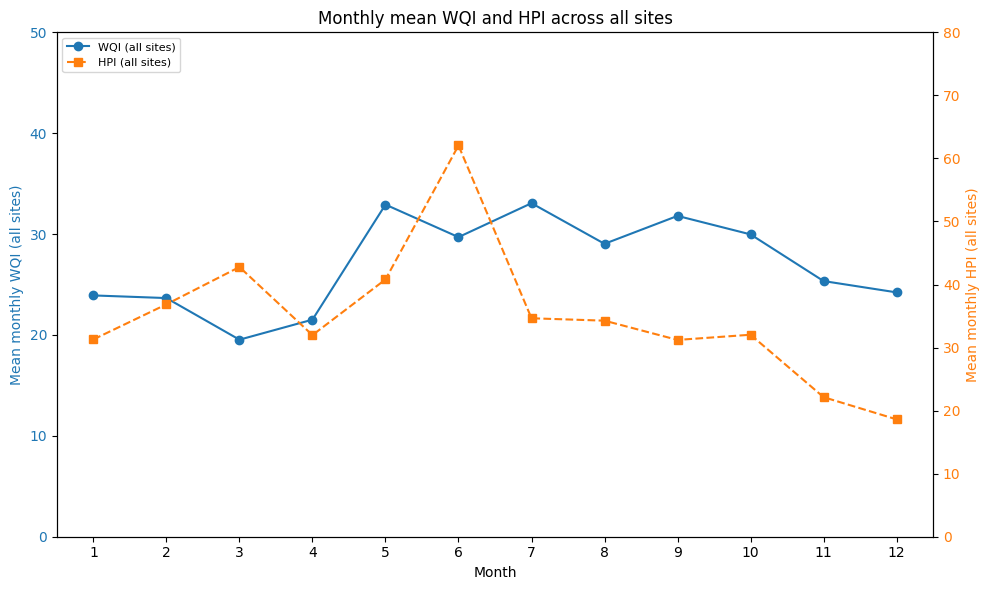

In [10]:
monthly_all_WQI = (WQI_gdf.groupby("month")["WQI"].mean().rename("WQI_monthly_all_sites").reset_index())

monthly_all_HPI = (HPI_gdf.groupby("month")["HPI"].mean().rename("HPI_monthly_all_sites").reset_index())


fig, ax1 = plt.subplots(figsize=(10, 6))

# left y-axis: WQI
ax1.plot(
    monthly_all_WQI['month'],
    monthly_all_WQI['WQI_monthly_all_sites'],
    marker='o',
    linestyle='-',
    label='WQI (all sites)'
)
ax1.set_xlabel('Month')
ax1.set_ylabel('Mean monthly WQI (all sites)', color='C0')
ax1.set_xticks(range(1, 13))
ax1.set_xlim(0.5, 12.5)
ax1.set_ylim(0, 50)
ax1.tick_params(axis='y', labelcolor='C0')

# right y-axis: HPI
ax2 = ax1.twinx()
ax2.plot(
    monthly_all_HPI['month'],
    monthly_all_HPI['HPI_monthly_all_sites'],
    marker='s',
    linestyle='--',
    label='HPI (all sites)',
    color='C1'
)
ax2.set_ylabel('Mean monthly HPI (all sites)', color='C1')
ax2.set_ylim(0, 80)
ax2.tick_params(axis='y', labelcolor='C1')

# combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper left', fontsize=8)

plt.title('Monthly mean WQI and HPI across all sites')
plt.tight_layout()

# plt.savefig('Mean_WQI_HPI.png', dpi = 300)
# files.download('Mean_WQI_HPI.png')

plt.show()

## Interactive Map: Using Indeces

### Main Map

In [11]:
# Interactive Map

years = [2015,2016,2017,2018,2019,2020, 2021, 2022, 2023, 2024]

# Just Chicago
bbox = (-88.15, 41.55, -87.3, 42.10)
chicago_streams = streams.cx[bbox[0]:bbox[2], bbox[1]:bbox[3]]

map = chicago_streams.explore(
    tiles="CartoDB Positron",
    name="Streams",
    style_kwds={"color": "steelblue", "weight": 2}
)

unique_avg_wqi_gdf = avg_wqi_gdf.drop_duplicates(subset='Sampling')
unique_avg_HPI_gdf = avg_HPI_gdf.drop_duplicates(subset='Sampling')

#https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html

for yr in years:
    df_year = (
        avg_wqi_gdf[avg_wqi_gdf['year'] == yr]
        .drop_duplicates(subset='Sampling')
    )

    df_year.explore(
        m=map,
        column='mean_annual_WQI',
        cmap='Spectral_r',
        legend=False,
        vmin=0,
        vmax=100,
        marker_kwds=dict(radius=7, fill=True),
        tooltip=["Sampling", "year", "mean_annual_WQI"],
        tooltip_kwds=dict(labels=True),
        name=f"WQI {yr}",
        show = False
    )

for yr in years:
    df_year = (
        avg_HPI_gdf[avg_HPI_gdf['year'] == yr]
        .drop_duplicates(subset='Sampling')
    )

    df_year.explore(
        m=map,
        column='mean_annual_HPI',
        cmap='cividis',
        legend=False,
        vmax=100,
        marker_kwds=dict(radius=7, fill=True),
        tooltip=["Sampling", "year", "mean_annual_HPI"],
        tooltip_kwds=dict(labels=True),
        name=f"HPI {yr}",
        show = False
    )


unique_avg_wqi_gdf.explore(
    m=map,  # pass the map object
    column='mean_10yr_WQI', cmap='Spectral_r', legend = True,
    vmin = 0,
    vmax = 100,
    marker_kwds=dict(radius=7, fill=True),  # make marker radius 10px with fill
    tooltip=["Sampling","mean_10yr_WQI"],  # show "name" column in the tooltip
    tooltip_kwds=dict(labels=True),  # do not show column label in the tooltip
    name="WQI",  # name of the layer in the map
)

unique_avg_HPI_gdf.explore(
    m=map,  # pass the map object
    column='mean_10yr_HPI', cmap='Spectral_r',
    legend = True,
    vmin = 0,
    vmax = 100,
    legend_kwds={
        "fmt": "{:.0f}",
        "scale": False,
        "max_labels": 5 },
    marker_kwds=dict(radius=7, fill=True),  # make marker radius 10px with fill
    tooltip=["Sampling","mean_10yr_HPI"],  # show "name" column in the tooltip
    tooltip_kwds=dict(labels=True),  # do not show column label in the tooltip
    name="HPI",  # name of the layer in the map
)

folium.LayerControl().add_to(map)
map

### Individual Yearly Maps of WQI

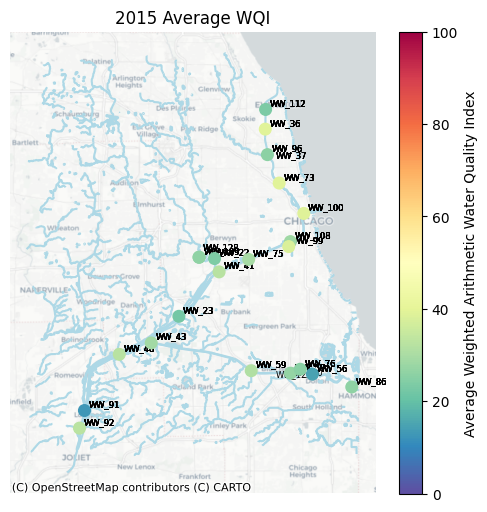

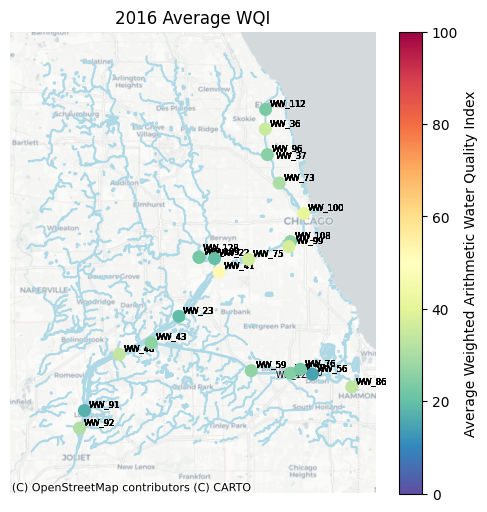

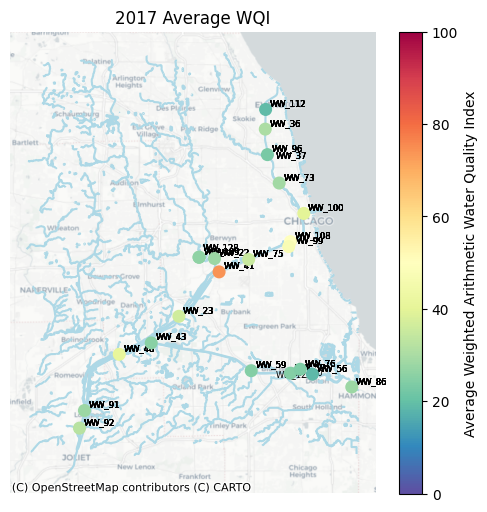

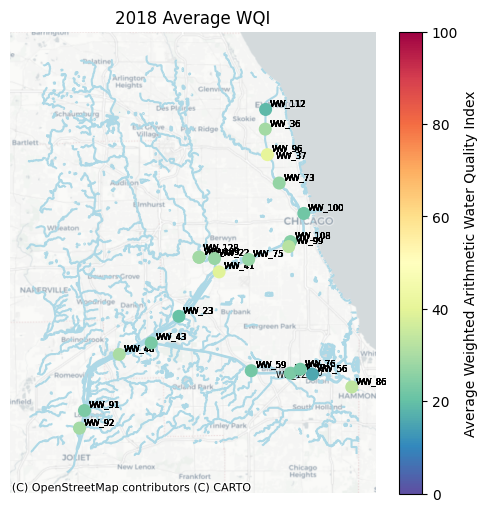

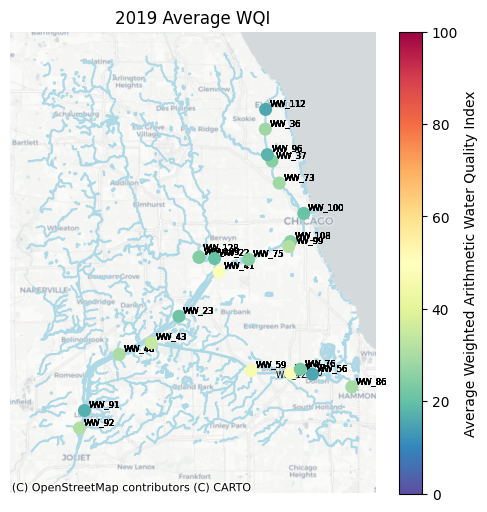

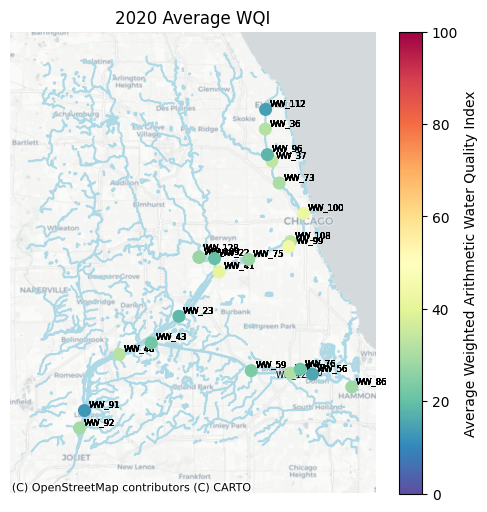

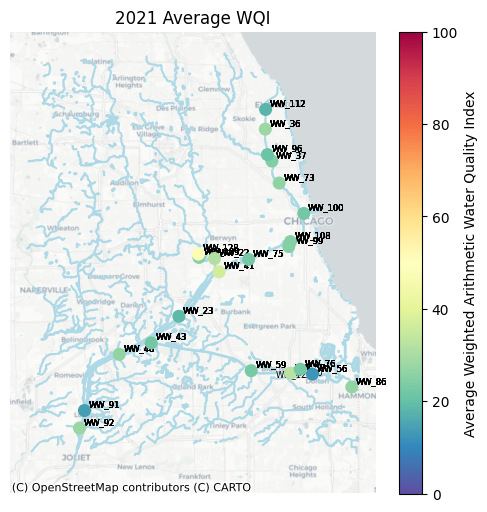

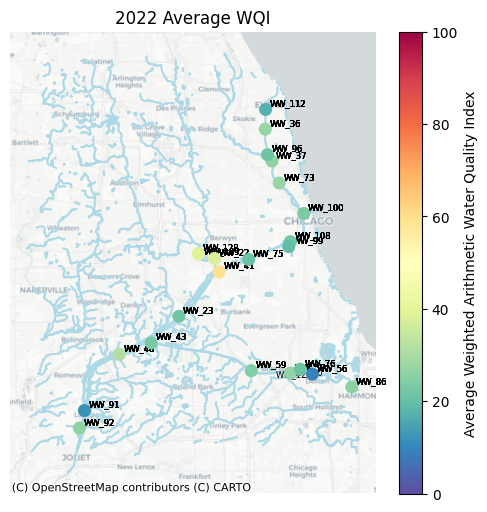

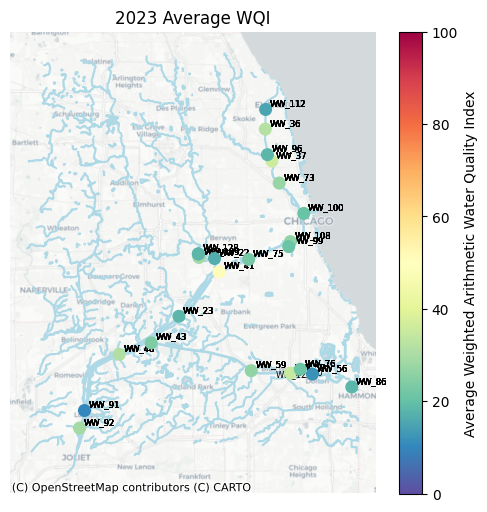

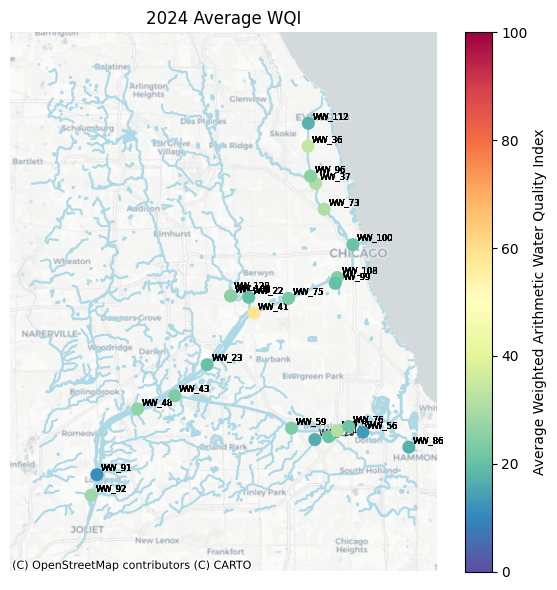

In [12]:
years = [2015,2016,2017,2018,2019,2020, 2021, 2022, 2023, 2024]

for i, year in enumerate(years):
    fig, ax = plt.subplots(figsize=(6, 6))

    avg_wqi_gdf_year = avg_wqi_gdf[avg_wqi_gdf['year'] == year]

    avg_wqi_gdf_year.plot(ax=ax,column='mean_annual_WQI',cmap='Spectral_r',vmin=0,vmax=100,legend=True,legend_kwds={'label': 'Average Weighted Arithmetic Water Quality Index'},markersize=70,label='Sampling',zorder=10)

    chicago_streams.plot(ax=ax,color='lightblue',zorder=1)

    ax.set_title(f'{year} Average WQI')
    ax.set_axis_off()

    ctx.add_basemap(
        ax,
        crs=chicago_streams.crs,
        source=ctx.providers.CartoDB.Positron
    )

    for x, y, label in zip(avg_wqi_gdf.geometry.x, avg_wqi_gdf.geometry.y, avg_wqi_gdf['Sampling']):
      ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=6)

plt.tight_layout()
plt.show()


### Individual Yearly Maps of HPI

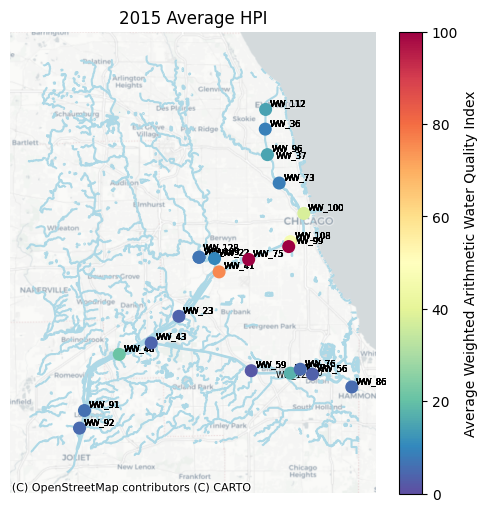

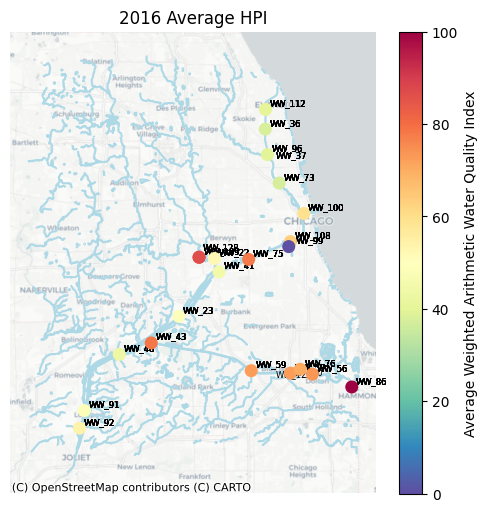

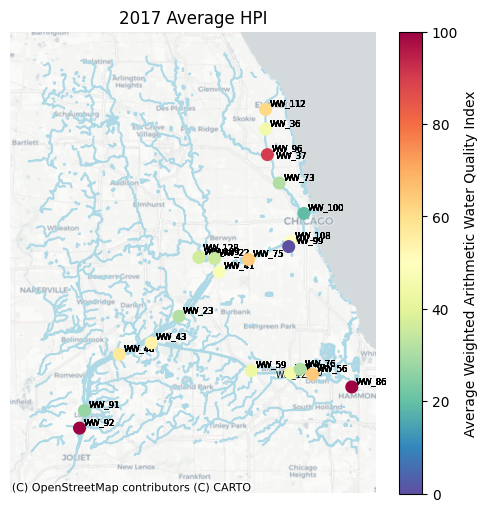

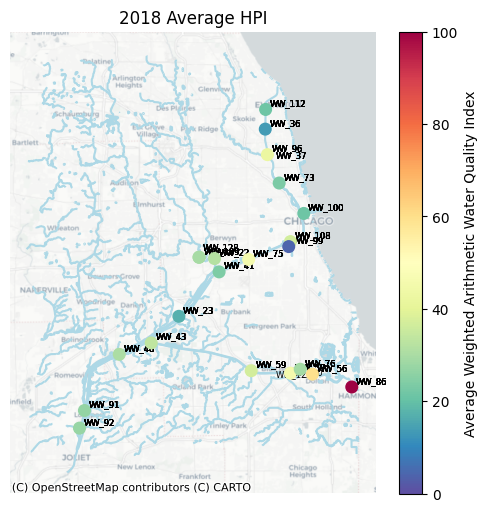

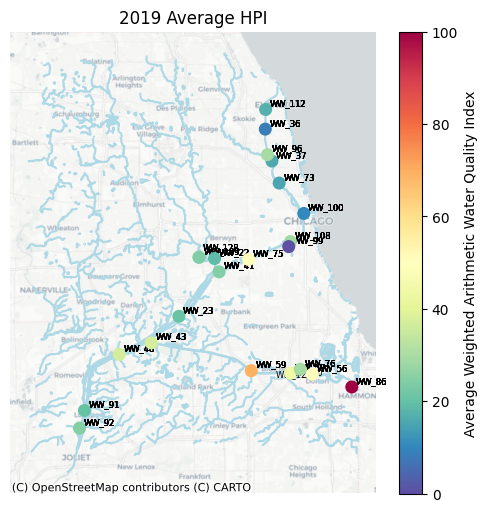

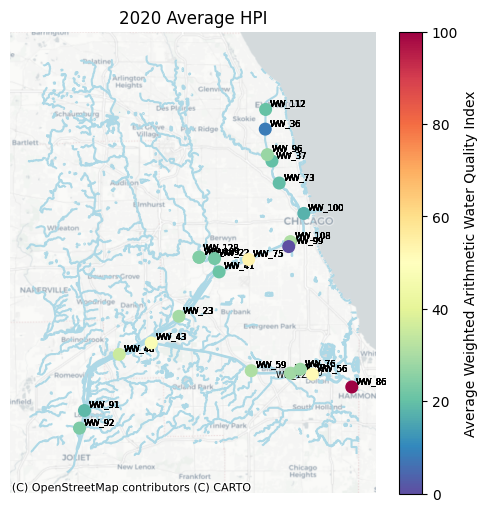

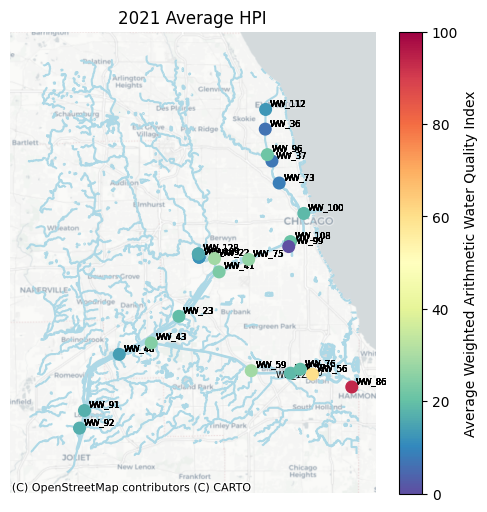

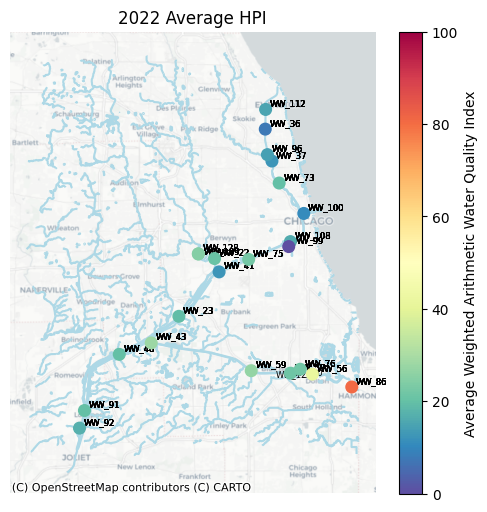

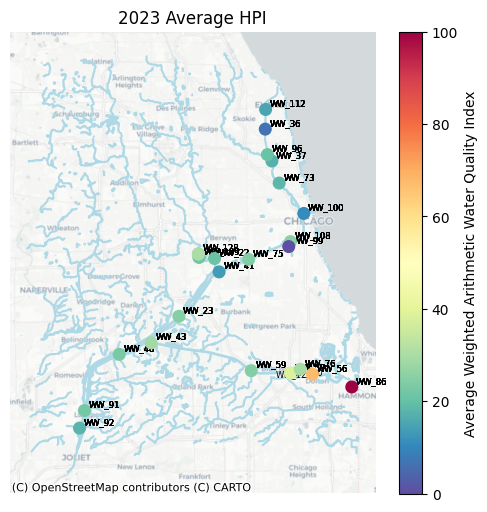

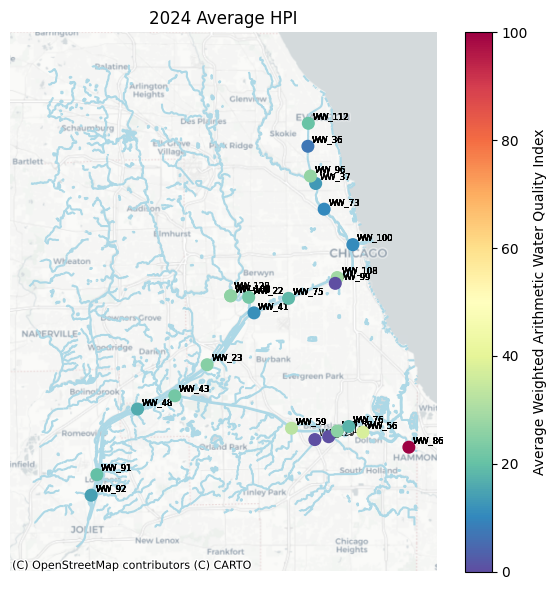

In [13]:
years = [2015,2016,2017,2018,2019,2020, 2021, 2022, 2023, 2024]


for i, year in enumerate(years):
    fig, ax = plt.subplots(figsize=(6, 6))

    avg_HPI_gdf_year = avg_HPI_gdf[avg_HPI_gdf['year'] == year]

    avg_HPI_gdf_year.plot(ax=ax,column='mean_annual_HPI',cmap='Spectral_r',vmin=0,vmax=100,legend=True,legend_kwds={'label': 'Average Weighted Arithmetic Water Quality Index'},markersize=70,label='Sampling',zorder=10)

    chicago_streams.plot(ax=ax,color='lightblue',zorder=1)

    ax.set_title(f'{year} Average HPI')
    ax.set_axis_off()

    ctx.add_basemap(
        ax,
        crs=chicago_streams.crs,
        source=ctx.providers.CartoDB.Positron
    )

    for x, y, label in zip(avg_wqi_gdf.geometry.x, avg_wqi_gdf.geometry.y, avg_wqi_gdf['Sampling']):
      ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=6)

plt.tight_layout()
plt.show()


In [14]:
WQI_gdf['HPI'] = HPI_gdf['HPI']

vars = ['DO  ', 'pH   ','NO2+NO3', 'NH3_N ', 'TKN  ', 'Tot P', 'TDS', 'SS  ', 'VSS ', 'TOC ',
       'CN   ', 'FEC_COL', 'Chlorophyll-A', 'Cl', 'F    ', 'SO4   ', 'ALK',
       'As sol', 'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol',
       'Hg LL', 'Ca tot', 'Mg tot', 'Hardness', 'B tot', 'WQI', 'HPI']


WQI_gdf_sorted =WQI_gdf.sort_values(by=['Sampling', 'Collect_dt'])
WQI_gdf_sorted

diff_cols = [f"{v}_diff" for v in vars]

WQI_gdf_sorted[diff_cols] = (
    WQI_gdf_sorted
      .groupby("Sampling")[vars]
      .diff()
)

WQI_gdf_sorted_diffs = WQI_gdf_sorted[['Sampling']+diff_cols]
#WQI_gdf_sorted_diffs

WQI_gdf_sorted_diffs['cumcount']=WQI_gdf_sorted_diffs.groupby('Sampling').cumcount()

for diff in diff_cols:
  WQI_gdf_sorted_diffs[diff] = np.where(WQI_gdf_sorted_diffs['cumcount'] == 0, np.nan, WQI_gdf_sorted_diffs[diff])

WQI_gdf_sorted_diffs = WQI_gdf_sorted_diffs.drop(columns=['cumcount', 'Sampling'])






/var/folders/n_/g7xjxr1n0qn9t7n24wx283jc0000gn/T/ipykernel_57321/777639473.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WQI_gdf_sorted_diffs['cumcount']=WQI_gdf_sorted_diffs.groupby('Sampling').cumcount()
/var/folders/n_/g7xjxr1n0qn9t7n24wx283jc0000gn/T/ipykernel_57321/777639473.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  WQI_gdf_sorted_diffs[diff] = np.where(WQI_gdf_sorted_diffs['cumcount'] == 0, np.nan, WQI_gdf_sorted_diffs[diff])


## Correlation Heatmap of Variables

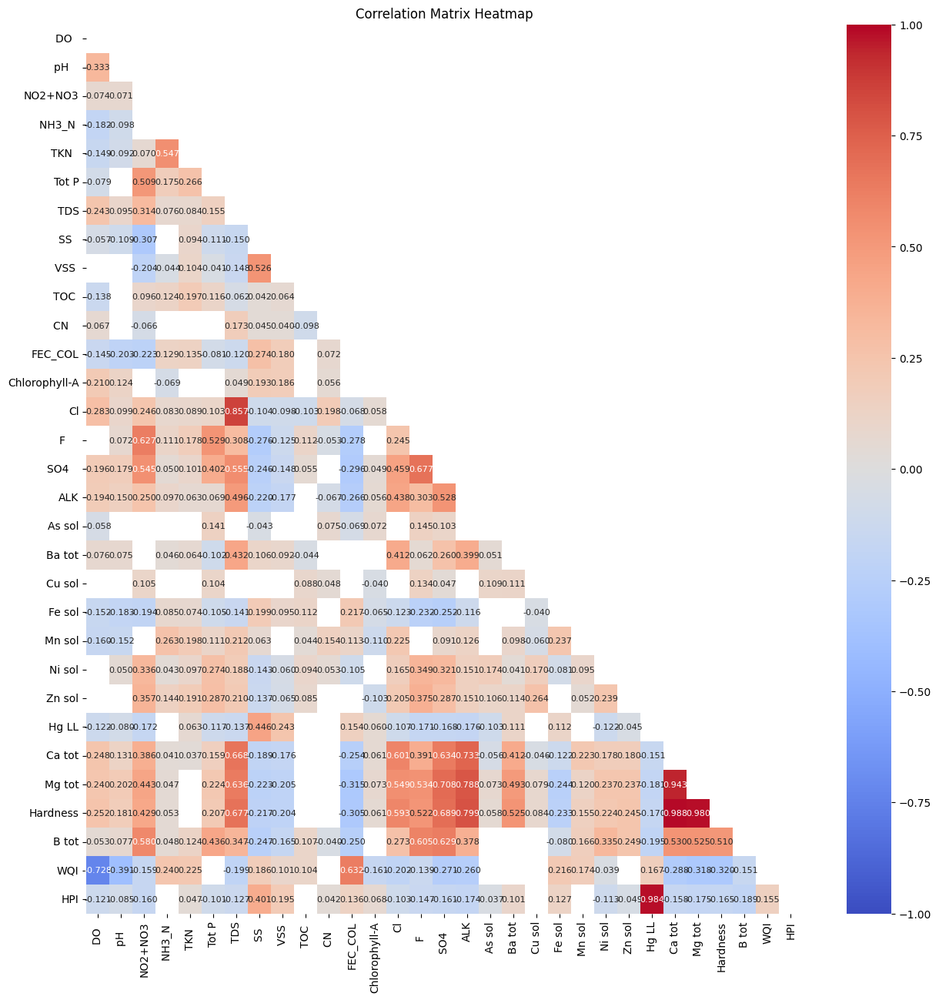

In [15]:

#copied and adapted from my lab 1

n=WQI_gdf_sorted_diffs.shape[1]
pval_matrix = np.zeros((n,n))
corr_matrix = np.zeros((n,n))


for i in range(n):  #loops through all columns
    for j in range(n): #for ever loop through a column, loops through all columns
        col1 = WQI_gdf_sorted_diffs.iloc[:, i] #gets "i" column
        col2 = WQI_gdf_sorted_diffs.iloc[:, j] #gets "j" column
        cor, pval = spearmanr(col1,col2,nan_policy='omit') #runs spearman test for current columns i and j, saves pval output
        if cor==1:
            cor=0
        pval_matrix[i,j] = pval # assigns pval in empty pval matrix for current position (i,j)
        corr_matrix[i,j] = cor

mask_upper = np.triu(np.ones_like(corr_matrix, dtype=bool))
pval_mask = pval_matrix>=.05 #converts pval matric from for loop to boolean matrix
combined_mask=combined_mask = (pval_matrix >= 0.05) | mask_upper

corr_df = pd.DataFrame(corr_matrix, index=vars, columns=vars)

plt.figure(figsize = (15,15))
sns.heatmap(corr_df,vmin = -1, vmax = 1, mask = combined_mask, annot = True, cmap='coolwarm', fmt='.3f',annot_kws={"fontsize":8}) #used seaborn corr heatmap with my created mask)
plt.title('Correlation Matrix Heatmap')

# plt.savefig('Spearman_corrs.png')
# files.download('Spearman_corrs.png')

plt.show()

#instead of correlating actual values to each other, take the relative values of consecutive points in time (the difference) to see if the changes in values from month to month is correlated.
#if correlation still does not make sense, what else might they be limited by??

# nutrient ratios as well, how do they differ between sites with high and low chlorphyll


## Calculating Buildup and Seasonality: Defining Chicago Waterway Segments and Flow

### Detailing out the branches

In [16]:
# Some history on the river flow: https://www.youtube.com/watch?v=kSsrrKMwPzQ
# Sub continental divide use to push flow to Lake Michigan East and into Mississippi River West
# In late 1800s, Chicago reversed the river flow to send wastewater West into Des Plaines River to the Mississippi
# The solution to pollution is dilution, they said!

# North Branch Canal, which flows from the loop North West to the North Branch of the Chicago River
North_branch_canal = ["WW_100", "WW_73", "WW_37"]
NBC_start = "WW_100"
NBC_end = "WW_37"

# North Shore Channel, which flows from from Wilmette Harbor South to join the North Branch Canal to flow into the North Branch of the Chicago River
North_shore_channel = ["WW_112", "WW_36", "WW_96"]
NSC_start = "WW_112"
NSC_end = "WW_96"

# Chicago Sanitary and Ship Canal flowing SW from Chicago to the Des Plaines River
Chicago_sanitary_ship_canal = ["WW_108", "WW_99", "WW_75", "WW_41", "WW_23", "WW_43", "WW_48", "WW_91", "WW_92"]
CSSC_start = "WW_108"
CSSC_end = "WW_92"

# Little Calumet River on the southern edge of Chicago, which flows West and joins the Chicago Sanitary Ship Canal and flows onto WW_43
Little_calumet_river = ["WW_56", "WW_76", "WW_57", "WW_130", "WW_129", "WW_59"]
LCR_start = "WW_56"
LCR_end = "WW_59"

start_site_list = ["WW_100", "WW_112", "WW_108", "WW_56"]
end_site_list = ["WW_37", "WW_96", "WW_92", "WW_59"]

In [17]:
#HPI_gdf.head()
#WQI_gdf.head()

## Combine our index df's into one df
full_data = HPI_gdf.merge(
    WQI_gdf[['Collect_dt', 'Sampling', 'geometry', 'WQI']],
    on=['Collect_dt', 'Sampling', 'geometry'],
    how = 'left'
)

### Boxplots

In [18]:
## Creating a melted df to run boxplots comparing key variables from waterway start to ends

# Strip whitespace from all column names
full_data_clean = full_data.copy()
full_data_clean.columns = full_data_clean.columns.str.strip()

# focusing on samples where specific values (not just detection limits) were recorded
samples_of_interest = ['WQI', 'ALK', 'Cl', 'F', 'Ca tot', 'SO4', 'pH', 'NO2+NO3', 'Tot P', 'DO', 'Chlorophyll-A', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol', 'Hg LL', 'Hardness', 'Mg tot', 'B tot', 'HPI']

rivers = {
    "North Branch Canal": (NBC_start, NBC_end),
    "North Shore Channel": (NSC_start, NSC_end),
    "Chicago Sanitary & Ship Canal": (CSSC_start, CSSC_end),
    "Little Calumet River": (LCR_start, LCR_end)
}

# filter the dataframe to only include start and end sites and the samples of interest
start_end_filter_df = full_data_clean.loc[full_data_clean["Sampling"].isin(start_site_list + end_site_list), ['Collect_dt'] + ["Sampling"] + samples_of_interest].copy()

# Build a DataFrame with columns: Waterway, Location (Start/End), Value, Variable
for site in start_end_filter_df['Sampling']:
    for river_name, (start, end) in rivers.items():
        if site == start:
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Waterway'] = river_name
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Location'] = 'Start'
        elif site == end:
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Waterway'] = river_name
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Location'] = 'End'

# Melt the DataFrame for seaborn boxplotting
# 'id_vars' are the columns to keep, 'value_vars' are the measurement columns to unpivot, ignore NaNs
melted_df = start_end_filter_df.melt(id_vars = ['Sampling', 'Waterway', 'Location', 'Collect_dt'], value_vars = samples_of_interest, var_name = 'Sample Variable', value_name = 'Sample') #.sort_values(by = 'Location', ascending = False)
melted_df['Waterway_Location'] = melted_df['Waterway'] + ' ' + melted_df['Location']

#display(melted_df)

# Define boxplot order
watershed_order = ['North Branch Canal Start',
                   'North Shore Channel Start',
                   'Chicago Sanitary & Ship Canal Start',
                   'Little Calumet River Start',
                   'North Branch Canal End',
                   'North Shore Channel End',
                   'Chicago Sanitary & Ship Canal End',
                   'Little Calumet River End']
hue_order_list = ['North Branch Canal', 'North Shore Channel', 'Chicago Sanitary & Ship Canal', 'Little Calumet River']


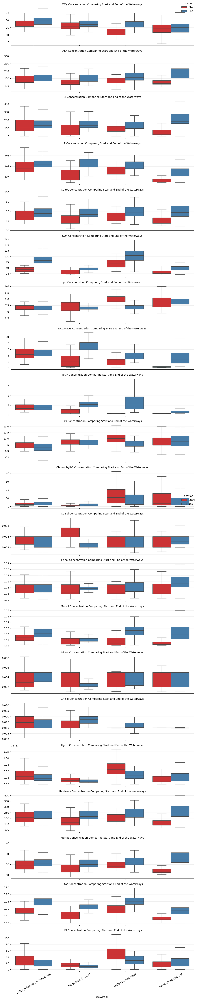

In [19]:
## Now our boxplots. Each row is a variable, x-axis is waterway, color indicates whether testing position is at start or end

# Make Start/End a categorical with fixed order
melted_df["Location"] = pd.Categorical(melted_df["Location"],
                                       categories=["Start", "End"],
                                       ordered=True)

# Shorten names in case useful later
rename_map = {
    "North Branch Canal": "NBC",
    "North Shore Channel": "NSC",
    "Chicago Sanitary & Ship Canal": "CSSC",
    "Little Calumet River": "LCR"
}
melted_df["Waterway_short"] = melted_df["Waterway"].map(rename_map)

# Catplot to generate boxplots
grid = sns.catplot(
    data = melted_df,
    kind = "box",
    x = "Waterway",             # Each waterway on x-axis
    y = "Sample",
    hue = "Location",           # Start vs. end next to each other
    row = "Sample Variable",    # One row per variable (as before)
    sharex = True,
    sharey = False,
    height = 2.6,
    aspect = 3.5,
    palette = "Set1",
    showfliers = False
)

# Adding units of concentration to y-axis
for ax in grid.axes.flatten():
    ax.tick_params(axis="x", rotation=30)
    ax.grid(axis="y", alpha=0.2)

    ## adding y axis labels with units where applicable
    sample_var = ax.get_title()

# Setting titles, axes, legends
grid.set_axis_labels("Waterway", "")
grid.add_legend(title="Location", loc="upper right")
grid.set_titles("{row_name} Concentration Comparing Start and End of the Waterways")
plt.tight_layout()

# plt.savefig('Start_end_bp.png')
# files.download('Start_end_bp.png')

plt.show()


### Time Series Comparisons of Start and End Stations

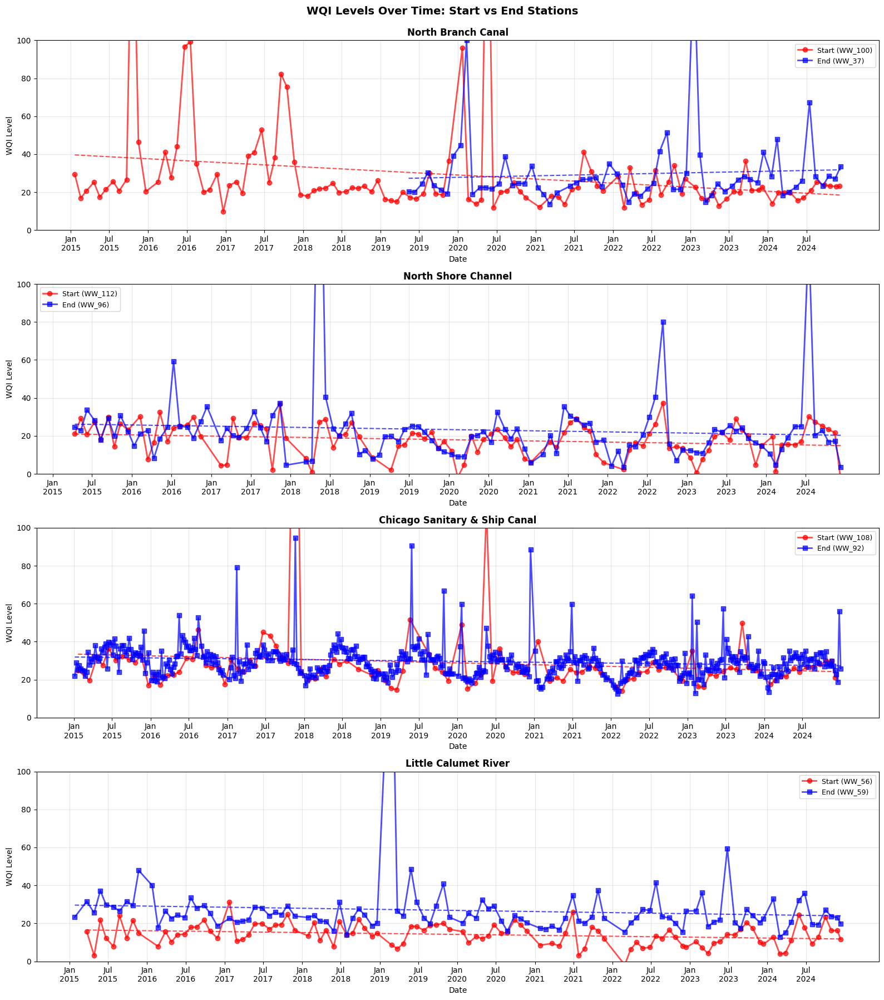

In [20]:
'''Time series analysis showing how pollutant levels change over time at start vs end stations for each waterway'''

# Select the variable to plot
variable_to_plot = 'WQI'

# Filter data for the selected variable
scatter_df = melted_df.loc[melted_df['Sample Variable'] == variable_to_plot].copy()
scatter_df['Collect_dt'] = pd.to_datetime(scatter_df['Collect_dt'])

# Create 2x2 grid for the four waterways
fig, axes = plt.subplots(4, 1, figsize=(16, 18))
axes = axes.flatten()

# Plot each waterway
for i, (river_name, (start_station, end_station)) in enumerate(rivers.items()):
        ax = axes[i]

        # Filter data for this waterway's start and end stations
        start_data = scatter_df[(scatter_df['Waterway'] == river_name) & (scatter_df['Location'] == 'Start')]
        end_data = scatter_df[(scatter_df['Waterway'] == river_name) & (scatter_df['Location'] == 'End')]

        # Plot start station
        ax.plot(start_data['Collect_dt'], start_data['Sample'],
                marker='o', linestyle='-', linewidth=2, markersize=6,
                label=f'Start ({start_station})', alpha=0.7, color = 'red')

        # add line of regression to catch linear trend over years
        ax.plot(start_data['Collect_dt'], np.poly1d(np.polyfit(start_data['Collect_dt'].map(pd.Timestamp.toordinal), start_data['Sample'], 1))(start_data['Collect_dt'].map(pd.Timestamp.toordinal)), '--', alpha=0.7, color = 'red')

        # Plot end station
        ax.plot(end_data['Collect_dt'], end_data['Sample'],
                marker='s', linestyle='-', linewidth=2, markersize=6,
                label=f'End ({end_station})', alpha=0.7, color = 'blue')

        ## add line of regression to catch linear trend over years
        ax.plot(end_data['Collect_dt'], np.poly1d(np.polyfit(end_data['Collect_dt'].map(pd.Timestamp.toordinal), end_data['Sample'], 1))(end_data['Collect_dt'].map(pd.Timestamp.toordinal)), '--', alpha=0.7, color = 'blue')

        # Formatting
        ax.set_title(f'{river_name}', fontsize=12, fontweight='bold')
        ax.set_xlabel('Date', fontsize=10)
        ax.set_ylabel(f'{variable_to_plot} Level', fontsize=10)
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

        # Format x-axis to show months/years nicely
        start_year = scatter_df['Collect_dt'].min().year
        start = pd.Timestamp(f'{start_year}-01-01')
        end = scatter_df['Collect_dt'].max()
        ticks = pd.date_range(start=start, end=end, freq='6MS')
        ax.set_xticks(ticks)
        ax.set_xticklabels(ticks.strftime('%b\n%Y'))

        ax.tick_params(axis='x', rotation=0)

        # Adjust y axis to remove outliers
        y_min = 0
        y_max = 100 # excludes extreme outliers for better visualization
        ax.set_ylim(y_min, y_max)

plt.suptitle(f'{variable_to_plot} Levels Over Time: Start vs End Stations',
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()

# plt.savefig('WQI_timeseries.png')
# files.download('WQI_timeseries.png')

plt.show()

### Seasonality Time Series Plots

/var/folders/n_/g7xjxr1n0qn9t7n24wx283jc0000gn/T/ipykernel_57321/1317492215.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sn_avg_df = scatter_df.groupby(['Month', 'Location'])['Sample'].mean().reset_index()


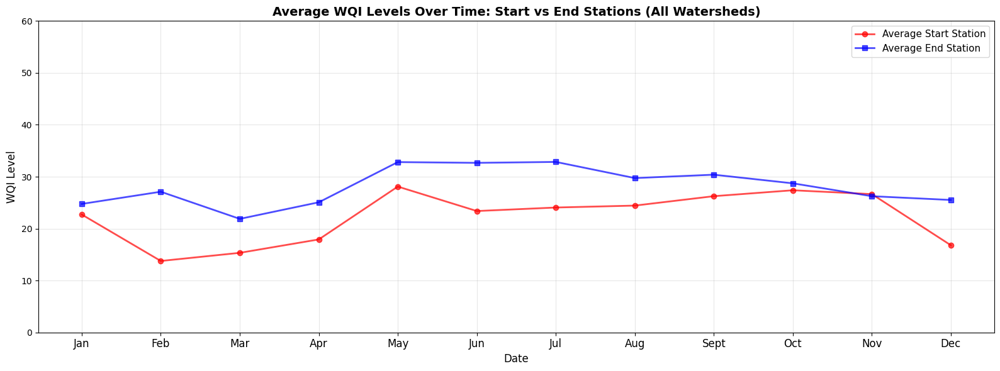

In [22]:
## Let's take a look at seasonality because it's hard to discern over the long timescale

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']

scatter_df['Month'] = scatter_df['Collect_dt'].dt.month

sn_avg_df = scatter_df.groupby(['Month', 'Location'])['Sample'].mean().reset_index()

# Separate start and end averages
start_avg = sn_avg_df[sn_avg_df['Location'] == 'Start']
end_avg = sn_avg_df[sn_avg_df['Location'] == 'End']

# Plot averages on single plot
fig, ax = plt.subplots(figsize=(16, 6))

ax.plot(start_avg['Month'], start_avg['Sample'],
        marker='o', linestyle='-', linewidth=2, markersize=6,
        label='Average Start Station', alpha=0.7, color = 'red')

ax.plot(end_avg['Month'], end_avg['Sample'],
        marker='s', linestyle='-', linewidth=2, markersize=6,
        label='Average End Station', alpha=0.7, color = 'blue')

# Formatting
ax.set_title(f'Average {variable_to_plot} Levels Over Time: Start vs End Stations (All Watersheds)', fontsize=14, fontweight='bold')
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel(f'{variable_to_plot} Concentration', fontsize=12)
ax.legend(loc='best', fontsize=11)
ax.grid(True, alpha=0.3)

# Formatting
ax.set_title(f'Average {variable_to_plot} Levels Over Time: Start vs End Stations (All Watersheds)', fontsize=14, fontweight='bold')
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel(f'{variable_to_plot} Level', fontsize=12)
ax.legend(loc='best', fontsize=11)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='x', rotation=0)

ax.set_xticks(range(1,13))
ax.set_xticklabels(months, fontsize = 12)

# Adjust y-axis limits as before
y_min = 0
y_max = 60
ax.set_ylim(y_min, y_max)

plt.tight_layout()

# plt.savefig('WQI_seasonality.png')
# files.download('WQI_seasonality.png')

plt.show()


### INSIGHTS

(TREND CHANGED AND SMOOTHED AFTER REMOVING CERTAIN OUTLIERS) WQI seems to spike in August at end stations and October at start stations.  This may be due to higher rainfall over the spring and summer leading to more runnoff and flooding by the end of the summer with peaks occuring at August.  Further buildup could push sediment further up river and cause a peak at the start of the watersheds in October (corresponding to the last rainfall peak).  August is also warm and may cause blooms and anoxic conditions after the buildup of organic nutrients toward the end of the channels.

### Extra Comparisons

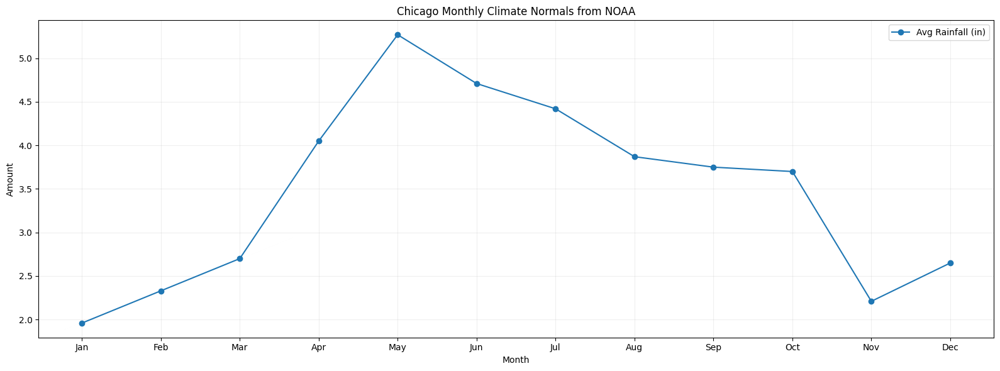

In [23]:
## Comparing to average rainfall in Chicago using NOAA measurements for OHare area (well measured because of air traffic) from 2006-2020 as proxy
## https://www.ncei.noaa.gov/access/us-climate-normals/?utm_source=chatgpt.com#dataset=normals-monthly&timeframe=15&location=IL&station=USW00094846

months = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
max_temp = [31.9, 34.2, 47.5, 59.1, 70.9, 80.7, 84.9, 83.1, 75.8, 62.4, 48.8, 36.9]
min_temp = [18.7, 19.7, 31.5, 40.1, 51.2, 61.3, 66.9, 65.7, 58.2, 45.5, 34.0, 24.5]
avg_temp = [25.3, 27.8, 39.5, 49.6, 61.1, 71.0, 75.9, 74.4, 67.0, 54.0, 41.4, 30.7]
precip = [1.96, 2.33, 2.70, 4.05, 5.27, 4.71, 4.42, 3.87, 3.75, 3.70, 2.21, 2.65]
snow = [10.7, 14.2, 4.5, 1.6, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3, 2.2, 8.9]

NOAA_data = {
    "Month":months,
    "MaxTempF":max_temp,
    "MinTempF":min_temp,
    "AvgTempF":avg_temp,
    "RainIn":precip,
    "SnowIn":snow
}

NOAA_df = pd.DataFrame(NOAA_data)

rainfall_plot = plt.figure(figsize=(16,6))

#plt.plot(NOAA_df['Month'], NOAA_df['AvgTempF'], marker = 'o' , label = 'Avg Temp (°F)')
plt.plot(NOAA_df['Month'], NOAA_df['RainIn'], marker = 'o' , label = 'Avg Rainfall (in)')
#plt.plot(NOAA_df['Month'], NOAA_df['SnowIn'], marker = 'o' , label = 'Avg Snowfall (in)')

plt.title('Chicago Monthly Climate Normals from NOAA')
plt.xlabel('Month')
plt.ylabel('Amount')
plt.grid(True, alpha = 0.2)
plt.legend()

plt.tight_layout()

# plt.savefig('Chicago_rainfall_plot.png', dpi = 300)
# files.download('Chicago_rainfall_plot.png')

plt.show()


### Specific Variable Time Series Plotting of Start and End Stations

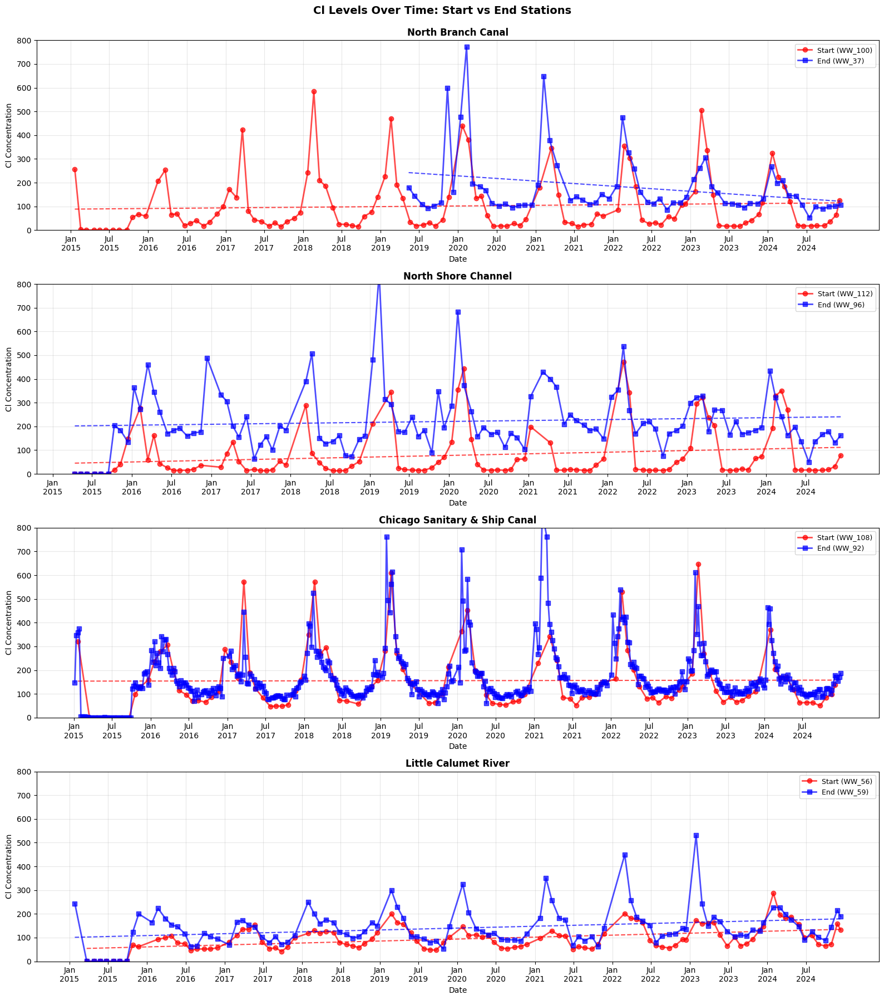

In [24]:
'''Time series analysis showing how pollutant levels change over time at start vs end stations for each waterway'''

# Select the variable to plot
variable_to_plot = 'Cl'

# Filter data for the selected variable
scatter_df = melted_df.loc[melted_df['Sample Variable'] == variable_to_plot].copy()
scatter_df['Collect_dt'] = pd.to_datetime(scatter_df['Collect_dt'])

# Create 2x2 grid for the four waterways
fig, axes = plt.subplots(4, 1, figsize=(16, 18))
axes = axes.flatten()

# Plot each waterway
for i, (river_name, (start_station, end_station)) in enumerate(rivers.items()):
        ax = axes[i]

        # Filter data for this waterway's start and end stations
        start_data = scatter_df[(scatter_df['Waterway'] == river_name) & (scatter_df['Location'] == 'Start')]
        end_data = scatter_df[(scatter_df['Waterway'] == river_name) & (scatter_df['Location'] == 'End')]

        # Plot start station
        ax.plot(start_data['Collect_dt'], start_data['Sample'],
                marker='o', linestyle='-', linewidth=2, markersize=6,
                label=f'Start ({start_station})', alpha=0.7, color='red')

        # add line of regression to catch linear trend over years
        ax.plot(start_data['Collect_dt'], np.poly1d(np.polyfit(start_data['Collect_dt'].map(pd.Timestamp.toordinal), start_data['Sample'], 1))(start_data['Collect_dt'].map(pd.Timestamp.toordinal)), '--', alpha=0.7, color='red')

        # Plot end station
        ax.plot(end_data['Collect_dt'], end_data['Sample'],
                marker='s', linestyle='-', linewidth=2, markersize=6,
                label=f'End ({end_station})', alpha=0.7, color = 'blue')

        ## add line of regression to catch linear trend over years
        ax.plot(end_data['Collect_dt'], np.poly1d(np.polyfit(end_data['Collect_dt'].map(pd.Timestamp.toordinal), end_data['Sample'], 1))(end_data['Collect_dt'].map(pd.Timestamp.toordinal)), '--', alpha=0.7, color = 'blue')

        # Formatting
        ax.set_title(f'{river_name}', fontsize=12, fontweight='bold')
        ax.set_xlabel('Date', fontsize=10)
        ax.set_ylabel(f'{variable_to_plot} Concentration', fontsize=10)
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

        # Format x-axis to show months/years nicely
        start_year = scatter_df['Collect_dt'].min().year
        start = pd.Timestamp(f'{start_year}-01-01')
        end = scatter_df['Collect_dt'].max()
        ticks = pd.date_range(start=start, end=end, freq='6MS')
        ax.set_xticks(ticks)
        ax.set_xticklabels(ticks.strftime('%b\n%Y'))

        ax.tick_params(axis='x', rotation=0)

        # Adjust y axis to remove outliers (use 60 for WQI, 600 for Cl)
        y_min = 0
        y_max = 800 # excludes extreme outliers for better visualization
        ax.set_ylim(y_min, y_max)

plt.suptitle(f'{variable_to_plot} Levels Over Time: Start vs End Stations',
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()

# plt.savefig('Cl_timeseries.png', dpi = 300)
# files.download('Cl_timeseries.png')

plt.show()

### Looking at Cl

Cl flucuates heavily (rising by multiple factors in the winter due to road salting)

The buildup of chlorine over time (due to road salting) seems to have decreased after 2021 in all channels except Little Calumet River.  Coincidentally, Chicago instituded salt monitoring in 2021 and urged the public to reduce road salting:
  
  https://mwrd.org/news/go-easy-salt-spreading-lightly-protects-water-quality-0?utm_source
  
  https://www.heplerbroom.com/blog/illinois-pollution-control-board-adopts-first-time-limited-water-quality-standard

  While average Cl levels seem fairly consistent, extreme Cl instances during Winter have fallen.



/var/folders/n_/g7xjxr1n0qn9t7n24wx283jc0000gn/T/ipykernel_57321/1054707068.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sn_avg_df = scatter_df.groupby(['Month', 'Location'])['Sample'].mean().reset_index()


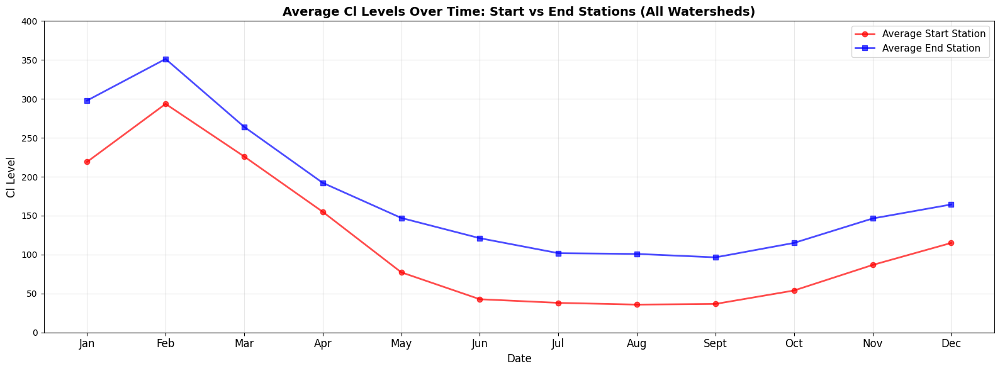

In [25]:
## Let's take a look at seasonality because it's hard to discern over the long timescale

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']

scatter_df['Month'] = scatter_df['Collect_dt'].dt.month

sn_avg_df = scatter_df.groupby(['Month', 'Location'])['Sample'].mean().reset_index()

# Separate start and end averages
start_avg = sn_avg_df[sn_avg_df['Location'] == 'Start']
end_avg = sn_avg_df[sn_avg_df['Location'] == 'End']

# Plot averages on single plot
fig, ax = plt.subplots(figsize=(16, 6))

ax.plot(start_avg['Month'], start_avg['Sample'],
        marker='o', linestyle='-', linewidth=2, markersize=6,
        label='Average Start Station', alpha=0.7, color = 'red')

ax.plot(end_avg['Month'], end_avg['Sample'],
        marker='s', linestyle='-', linewidth=2, markersize=6,
        label='Average End Station', alpha=0.7, color = 'blue')

# Formatting
ax.set_title(f'Average {variable_to_plot} Levels Over Time: Start vs End Stations (All Watersheds)', fontsize=14, fontweight='bold')
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel(f'{variable_to_plot} Concentration', fontsize=12)
ax.legend(loc='best', fontsize=11)
ax.grid(True, alpha=0.3)

# Formatting
ax.set_title(f'Average {variable_to_plot} Levels Over Time: Start vs End Stations (All Watersheds)', fontsize=14, fontweight='bold')
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel(f'{variable_to_plot} Level', fontsize=12)
ax.legend(loc='best', fontsize=11)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='x', rotation=0)

ax.set_xticks(range(1,13))
ax.set_xticklabels(months, fontsize = 12)

# Adjust y-axis limits as before
y_min = 0
y_max = 400
ax.set_ylim(y_min, y_max)

plt.tight_layout()

# plt.savefig('Cl_seasonality.png', dpi = 300)
# files.download('Cl_seasonality.png')

plt.show()


#### INSIGHTS
There's a spike in Cl levels in the late winter due to the accumulation of salt runoff.

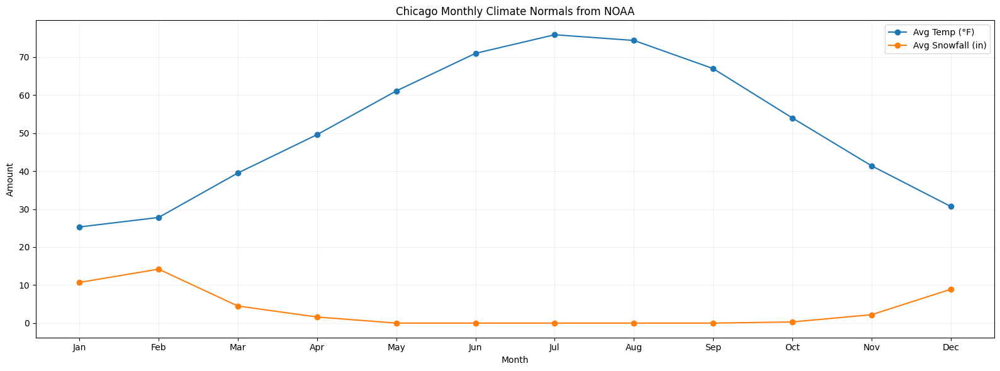

In [26]:
snowfall_plot = plt.figure(figsize=(16,6))

plt.plot(NOAA_df['Month'], NOAA_df['AvgTempF'], marker = 'o' , label = 'Avg Temp (°F)')
#plt.plot(NOAA_df['Month'], NOAA_df['RainIn'], marker = 'o' , label = 'Avg Rainfall (in)')
plt.plot(NOAA_df['Month'], NOAA_df['SnowIn'], marker = 'o' , label = 'Avg Snowfall (in)')

plt.title('Chicago Monthly Climate Normals from NOAA')
plt.xlabel('Month')
plt.ylabel('Amount')
plt.grid(True, alpha = 0.2)
plt.legend()

plt.tight_layout()

# plt.savefig('snowfall_temp.png', dpi = 300)
# files.download('snowfall_temp.png')

plt.show()

#### INSIGHTS
Cl levels match snowfall fluctuations and a combination of snowfall and temperature requiring more road salting because of accumulation on the ground.

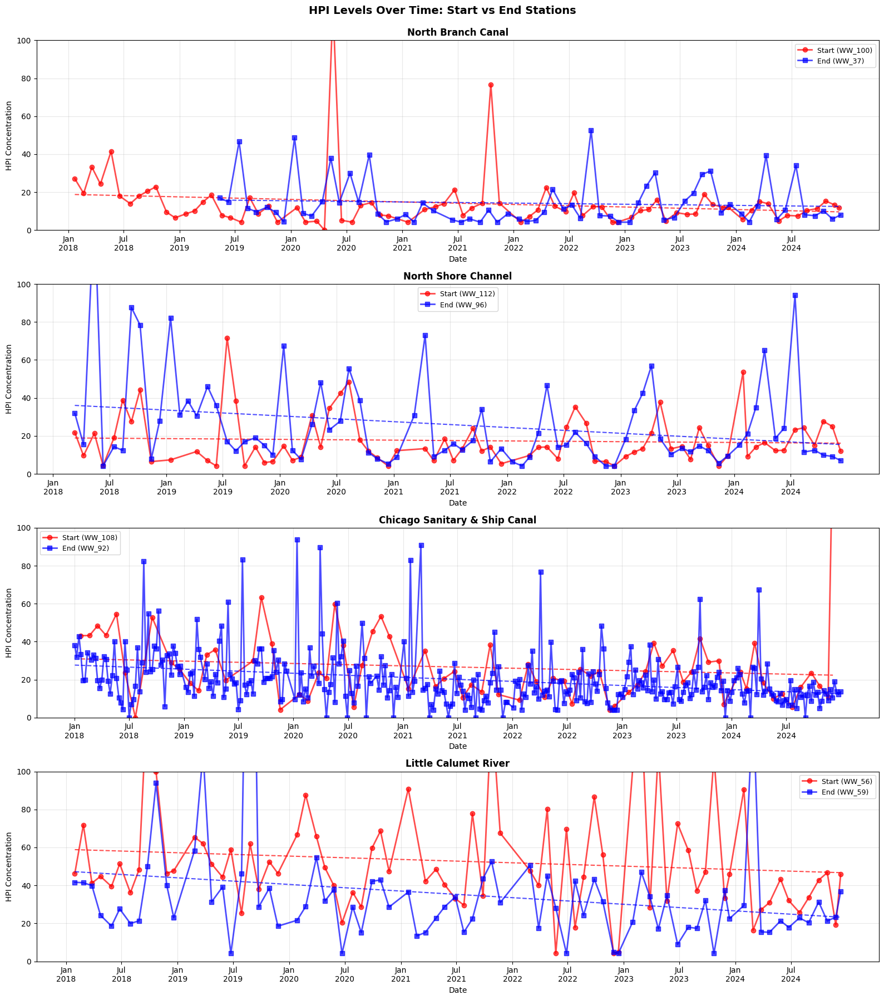

In [28]:
'''Time series analysis showing how pollutant levels change over time at start vs end stations for each waterway'''

# Select the variable to plot
variable_to_plot = 'HPI'

# Filter data for the selected variable and 2018 on years to avoid HPI data distortion from MWDR changing thresholds
scatter_df_HPI = melted_df.loc[
    (melted_df['Sample Variable'] == variable_to_plot)
    & (melted_df['Collect_dt'] > pd.Timestamp('2018-01-01'))
    ].copy()

# Create 2x2 grid for the four waterways
fig, axes = plt.subplots(4, 1, figsize=(16, 18))
axes = axes.flatten()

# Plot each waterway
for i, (river_name, (start_station, end_station)) in enumerate(rivers.items()):
        ax = axes[i]

        # Filter data for this waterway's start and end stations
        start_data = scatter_df_HPI[(scatter_df_HPI['Waterway'] == river_name) & (scatter_df_HPI['Location'] == 'Start')]
        end_data = scatter_df_HPI[(scatter_df_HPI['Waterway'] == river_name) & (scatter_df_HPI['Location'] == 'End')]

        # Plot start station
        ax.plot(start_data['Collect_dt'], start_data['Sample'],
                marker='o', linestyle='-', linewidth=2, markersize=6,
                label=f'Start ({start_station})', alpha=0.7, color = 'red')

        # add line of regression to catch linear trend over years
        ax.plot(start_data['Collect_dt'], np.poly1d(np.polyfit(start_data['Collect_dt'].map(pd.Timestamp.toordinal), start_data['Sample'], 1))(start_data['Collect_dt'].map(pd.Timestamp.toordinal)), '--', alpha=0.7, color = 'red')

        # Plot end station
        ax.plot(end_data['Collect_dt'], end_data['Sample'],
                marker='s', linestyle='-', linewidth=2, markersize=6,
                label=f'End ({end_station})', alpha=0.7, color = 'blue')

        ## add line of regression to catch linear trend over years
        ax.plot(end_data['Collect_dt'], np.poly1d(np.polyfit(end_data['Collect_dt'].map(pd.Timestamp.toordinal), end_data['Sample'], 1))(end_data['Collect_dt'].map(pd.Timestamp.toordinal)), '--', alpha=0.7, color = 'blue')

        # Formatting
        ax.set_title(f'{river_name}', fontsize=12, fontweight='bold')
        ax.set_xlabel('Date', fontsize=10)
        ax.set_ylabel(f'{variable_to_plot} Concentration', fontsize=10)
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

        # Format x-axis to show months/years nicely
        start_year = scatter_df_HPI['Collect_dt'].min().year
        start = pd.Timestamp(f'{start_year}-01-01')
        end = scatter_df_HPI['Collect_dt'].max()
        ticks = pd.date_range(start=start, end=end, freq='6MS')
        ax.set_xticks(ticks)
        ax.set_xticklabels(ticks.strftime('%b\n%Y'))

        ax.tick_params(axis='x', rotation=0)

        # Adjust y axis to remove outliers (use 60 for WQI, 600 for Cl)
        y_min = 0
        y_max = 100 # excludes extreme outliers for better visualization
        ax.set_ylim(y_min, y_max)

plt.suptitle(f'{variable_to_plot} Levels Over Time: Start vs End Stations',
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()

# plt.savefig('HPI_ts.png', dpi = 300)
# files.download('HPI_ts.png')

plt.show()

### Looking at HPI

There appears to be a decrease in extreme outlier pollution events over time and a small decrease in overall HPI overtime. This may be due to the implementation of TARP, which is preventing extreme runoff events during flash flooding.

The all channels appear to accumulate heavy metals except for the Little Calumet River, which is partially fed by the extremely polluted Grand Calumet River.  



/var/folders/n_/g7xjxr1n0qn9t7n24wx283jc0000gn/T/ipykernel_57321/2755600769.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sn_avg_df_HPI = scatter_df_HPI.groupby(['Month', 'Location'])['Sample'].mean().reset_index()


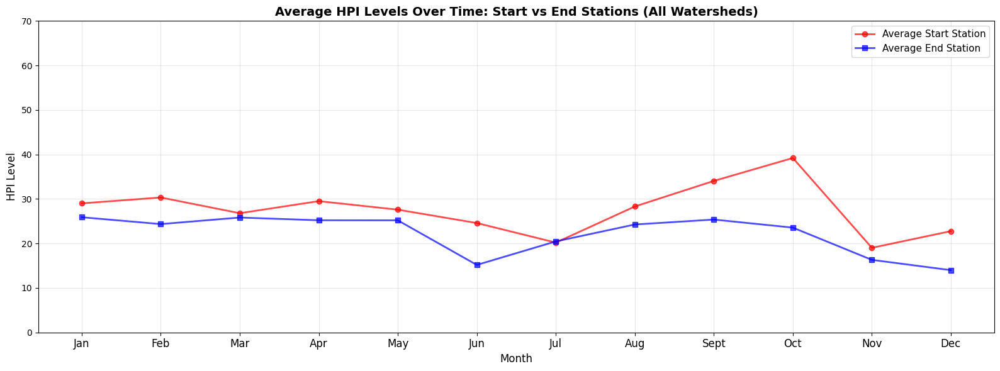

In [29]:
## Let's take a look at seasonality because it's hard to discern over the long timescale

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']

scatter_df_HPI['Month'] = scatter_df_HPI['Collect_dt'].dt.month

sn_avg_df_HPI = scatter_df_HPI.groupby(['Month', 'Location'])['Sample'].mean().reset_index()

# Separate start and end averages
start_avg = sn_avg_df_HPI[sn_avg_df_HPI['Location'] == 'Start']
end_avg = sn_avg_df_HPI[sn_avg_df_HPI['Location'] == 'End']

# Plot averages on single plot
fig, ax = plt.subplots(figsize=(16, 6))

ax.plot(start_avg['Month'], start_avg['Sample'],
        marker='o', linestyle='-', linewidth=2, markersize=6,
        label='Average Start Station', alpha=0.7, color = 'red')

ax.plot(end_avg['Month'], end_avg['Sample'],
        marker='s', linestyle='-', linewidth=2, markersize=6,
        label='Average End Station', alpha=0.7, color = 'blue')

# Formatting
ax.set_title(f'Average {variable_to_plot} Levels Over Time: Start vs End Stations (All Watersheds)', fontsize=14, fontweight='bold')
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel(f'{variable_to_plot} Concentration', fontsize=12)
ax.legend(loc='best', fontsize=11)
ax.grid(True, alpha=0.3)

# Formatting
ax.set_title(f'Average {variable_to_plot} Levels Over Time: Start vs End Stations (All Watersheds)', fontsize=14, fontweight='bold')
ax.set_xlabel('Month', fontsize=12)
ax.set_ylabel(f'{variable_to_plot} Level', fontsize=12)
ax.legend(loc='best', fontsize=11)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='x', rotation=0)

ax.set_xticks(range(1,13))
ax.set_xticklabels(months, fontsize = 12)

# Adjust y-axis limits as before
y_min = 0
y_max = 70
ax.set_ylim(y_min, y_max)

plt.tight_layout()

# plt.savefig('HPI_seasonality.png', dpi = 300)
# files.download('HPI_seasonality.png')

plt.show()


#### INSIGHTS
There is a noticeable spike in the heavy metals index in October, which may be due to the last heavy rainfall, after the waterways have accumulated enough volume to push back flow and put strain on the TARP system.   

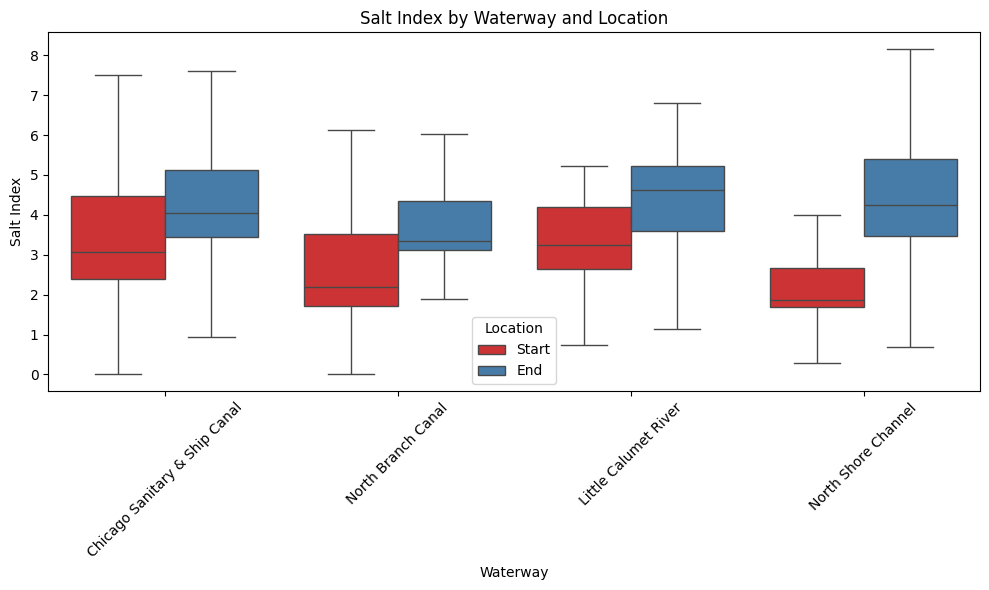

In [31]:
## Let's add a salt index because there seem to be some strong correlations between Ca, Mg, Cl, Alk, and SO4 -- which are added to the roads/runoff during winter

## Salt index
salt_variables = ['Cl', 'Ca tot', 'Mg tot', 'SO4']

salt_df = start_end_filter_df[['Sampling', 'Waterway', 'Location', 'Collect_dt'] + salt_variables].copy()

# Calculate salt index as sum of normalized concentrations
for var in salt_variables:
    mean_val = salt_df[var].mean()
    salt_df[f'{var}_norm'] = salt_df[var] / mean_val

salt_df['Salt_Index'] = salt_df[[f'{var}_norm' for var in salt_variables]].sum(axis=1)

# Reorder the location column

salt_df['Location'] = pd.Categorical(
    salt_df['Location'],
    categories = ['Start', 'End'],
    ordered = True
)

# Boxplot of salt index, removing extreme outliers
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=salt_df,
    x='Waterway',
    y='Salt_Index',
    hue='Location',
    palette='Set1',
    showfliers=False
)
plt.title('Salt Index by Waterway and Location')
plt.xlabel('Waterway')
plt.ylabel('Salt Index')
plt.xticks(rotation=45)
plt.tight_layout()

#plt.savefig('Salt_index_bp.png', dpi = 300)

plt.show()

In [32]:
# Add the Salt Index back into our start-end df renamed as waterways_df
waterways_df = start_end_filter_df.merge(
    salt_df[['Sampling', 'Salt_Index']],
    on='Sampling',
    how='left'
)

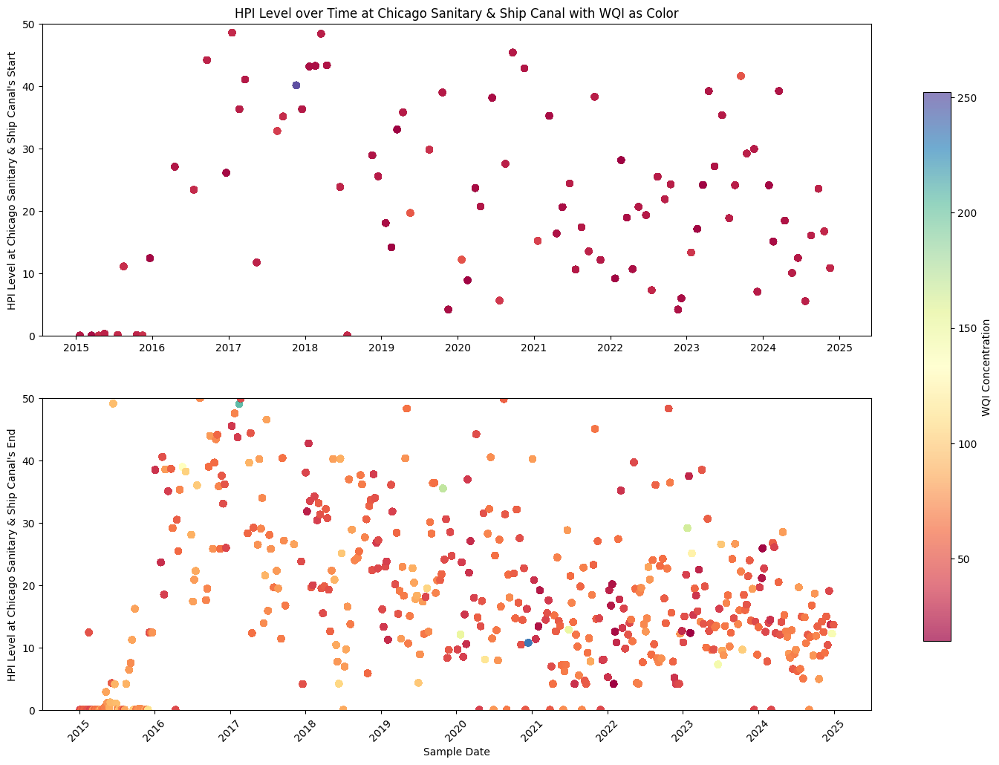

In [33]:
## Now a scatter plot to look at a couple specific relationships over time:
# Start/end of waterway with sample date (Collect) as the x axis, primary variable measurements on the y-axis, and secondary variable measurements as color

primary_variable = 'HPI'
secondary_variable = 'WQI'
waterway_of_interest = 'Chicago Sanitary & Ship Canal'

# create x, y, and color data for scatter plot start
scatter_x_start = waterways_df.loc[(waterways_df['Waterway'] == waterway_of_interest) & (waterways_df['Location'] == 'Start'),'Collect_dt']
scatter_y_start = waterways_df.loc[(waterways_df['Waterway'] == waterway_of_interest) & (waterways_df['Location'] == 'Start'), primary_variable]
scatter_color_start = waterways_df.loc[(waterways_df['Waterway'] == waterway_of_interest) & (waterways_df['Location'] == 'Start'), secondary_variable]

# create x, y, and color data for scatter plot end
scatter_x_end = waterways_df.loc[(waterways_df['Waterway'] == waterway_of_interest) & (waterways_df['Location'] == 'End'),'Collect_dt']
scatter_y_end = waterways_df.loc[(waterways_df['Waterway'] == waterway_of_interest) & (waterways_df['Location'] == 'End'), primary_variable]
scatter_color_end = waterways_df.loc[(waterways_df['Waterway'] == waterway_of_interest) & (waterways_df['Location'] == 'End'), secondary_variable]

# create empty figure
fig,ax = plt.subplots(2,1, sharex=False, figsize = (18,12))

# plot scatters
ax[0].scatter(x = scatter_x_start, y = scatter_y_start, c = scatter_color_start, cmap = 'Spectral', alpha = 0.7)
ax[1].scatter(x = scatter_x_end, y = scatter_y_end, c = scatter_color_end, cmap = 'Spectral', alpha = 0.7)

# colorbar and labels
fig.colorbar(ax[0].collections[0], ax=ax, label=f'{secondary_variable} Concentration', orientation='vertical', shrink=0.8)
plt.xlabel('Sample Date')
ax[0].set_ylabel(f'{primary_variable} Level at {waterway_of_interest}\'s Start')
ax[1].set_ylabel(f'{primary_variable} Level at {waterway_of_interest}\'s End')
ax[0].set_title(f'{primary_variable} Level over Time at {waterway_of_interest} with {secondary_variable} as Color')
## Set y axes limits to be the same for easier comparison
y_min = 0
y_max = 50  ## excludes outliers that make it hard to compare start and end concentrations
ax[0].set_ylim(y_min, y_max)
ax[1].set_ylim(y_min, y_max)
plt.xticks(rotation = 45)
plt.show()

## PCA

### Setting up variables and branches

In [34]:
vars = ['DO  ', 'pH   ','NO2+NO3', 'NH3_N ', 'TKN  ', 'Tot P', 'TDS', 'SS  ', 'VSS ', 'TOC ',
       'CN   ', 'FEC_COL', 'Chlorophyll-A', 'Cl', 'F    ', 'SO4   ', 'ALK',
       'As sol', 'Ba tot', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol',
       'Hg LL', 'Ca tot', 'Mg tot', 'Hardness', 'B tot']

In [35]:
North_branch_canal = ["WW_100", "WW_73", "WW_37"]
North_shore_channel = ["WW_112", "WW_36", "WW_96"]
Chicago_sanitary_ship_canal = ["WW_108", "WW_99", "WW_75", "WW_41",
                               "WW_23", "WW_43", "WW_48", "WW_91", "WW_92"]
Little_calumet_river = ["WW_56", "WW_76", "WW_57", "WW_130", "WW_129", "WW_59"]

branch_dict = {
    "North_Branch_Canal": North_branch_canal,
    "North_Shore_Channel": North_shore_channel,
    "Chicago_Ship_Canal": Chicago_sanitary_ship_canal,
    "Little_Calumet_River": Little_calumet_river
}

branch_data = {}
for name, stations in branch_dict.items():
    branch_data[name] = full_data[full_data["Sampling"].isin(stations)].copy()

### Main function to run

In [ ]:
def run_pca_pipeline(df, vars, title_prefix):
    X = df[vars].copy()

    # KNN Imputation
    imputer = KNNImputer(n_neighbors=5)
    X_imputed = imputer.fit_transform(X)
    X_imputed_df = pd.DataFrame(X_imputed, columns=vars, index=X.index)

    # Scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_imputed_df)
    X_scaled_df = pd.DataFrame(X_scaled, columns=vars, index=X.index)

    pca = PCA(n_components=3)
    pcs = pca.fit_transform(X_scaled_df)

    pca_df = pd.DataFrame(
        pcs,
        columns=["PC1", "PC2", "PC3"],
        index=X.index
    )

    # Loadings
    loadings = pd.DataFrame(
        pca.components_.T,
        index=vars,
        columns=["PC1", "PC2", "PC3"]
    )

    var_exp = pca.explained_variance_ratio_ * 100

    Q1 = df["WQI"].quantile(0.25)
    Q3 = df["WQI"].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    df[f"WQI_capped"] = df["WQI"].clip(lower, upper)
    df[f"WQI_norm"] = (
        df[f"WQI_capped"] - df[f"WQI_capped"].min()
    ) / (df[f"WQI_capped"].max() - df[f"WQI_capped"].min())

    pca_df["WQI_norm"] = df["WQI_norm"]

    plt.figure(figsize=(8, 10))
    sns.heatmap(loadings, annot=True, cmap="viridis", fmt=".2f")
    plt.title(f"PCA Loadings: {title_prefix}")
    plt.show()

    fig = px.scatter_3d(
        pca_df,
        x="PC1", y="PC2", z="PC3",
        color="WQI_norm",
        color_continuous_scale="RdBu_r",
        title=f"{title_prefix}: 3D PCA (Colored by WQI)",
        labels={
            "PC1": f"PC1 ({var_exp[0]:.1f}% Variance)",
            "PC2": f"PC2 ({var_exp[1]:.1f}% Variance)",
            "PC3": f"PC3 ({var_exp[2]:.1f}% Variance)",
            "WQI_norm": "Normalized WQI"
        }
    )

    fig.update_layout(
        width=1000,
        height=800,
        autosize=False,
        scene=dict(
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            ),
            aspectmode='cube',
            aspectratio=dict(x=1, y=1, z=1)
        ),
        coloraxis_colorbar=dict(
            title="WQI",
            thickness=20,
            len=0.75
        )
    )
    fig.show()

    arrow_traces = []
    for var in vars:
        arrow_traces.append(
            go.Scatter3d(
                x=[0, loadings.loc[var,"PC1"]],
                y=[0, loadings.loc[var,"PC2"]],
                z=[0, loadings.loc[var,"PC3"]],
                mode="lines+text",
                text=[None, var],
                textposition="top center",
                line=dict(width=6)
            )
        )

    fig2 = go.Figure(data=arrow_traces)
    fig2.update_layout(
        title=f"{title_prefix}: PCA Loading Vectors",
        width=1000,
        height=800,
        scene=dict(
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            ),
            aspectmode='cube',
            aspectratio=dict(x=1, y=1, z=1),
            xaxis_title="PC1 Loading",
            yaxis_title="PC2 Loading",
            zaxis_title="PC3 Loading"
        )
    )
    fig2.show()

    return pca_df, loadings, var_exp

### Full CAWS

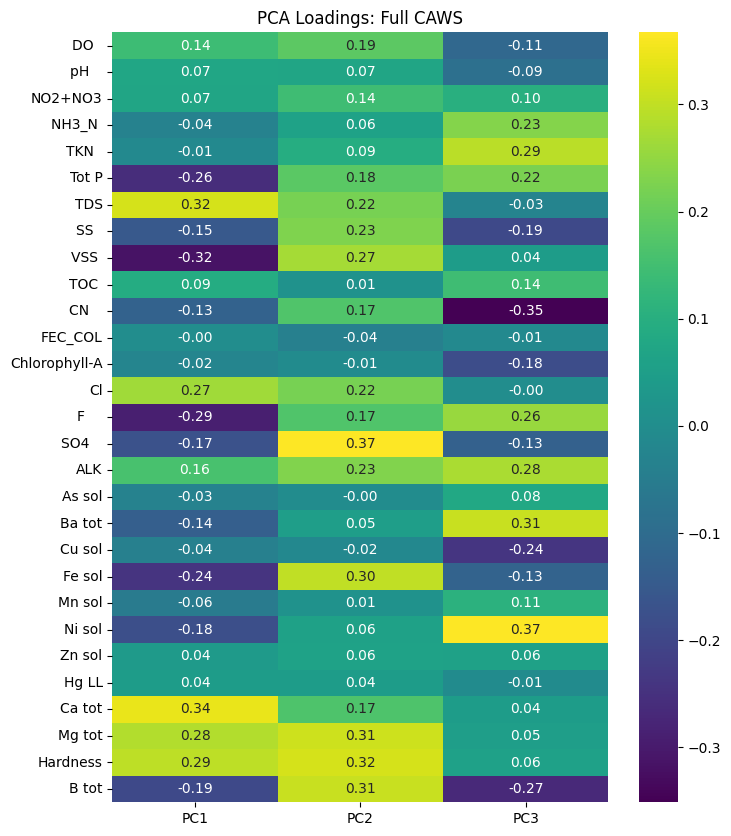

In [37]:
full_pca, full_loadings, full_var = run_pca_pipeline(full_data, vars, "Full CAWS")

### Results for each branch

PCA for North_Branch_Canal


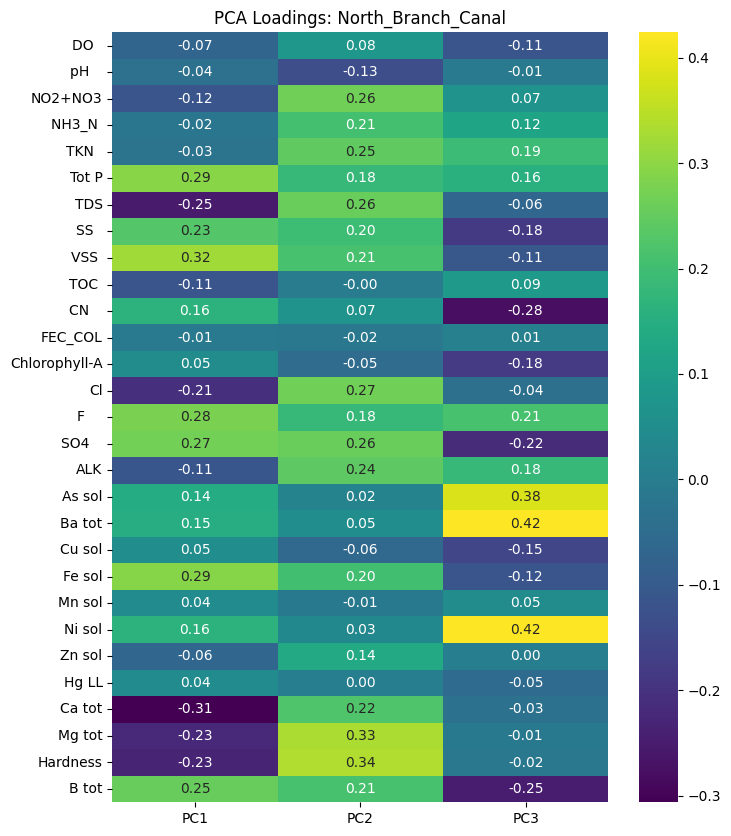

PCA for North_Shore_Channel


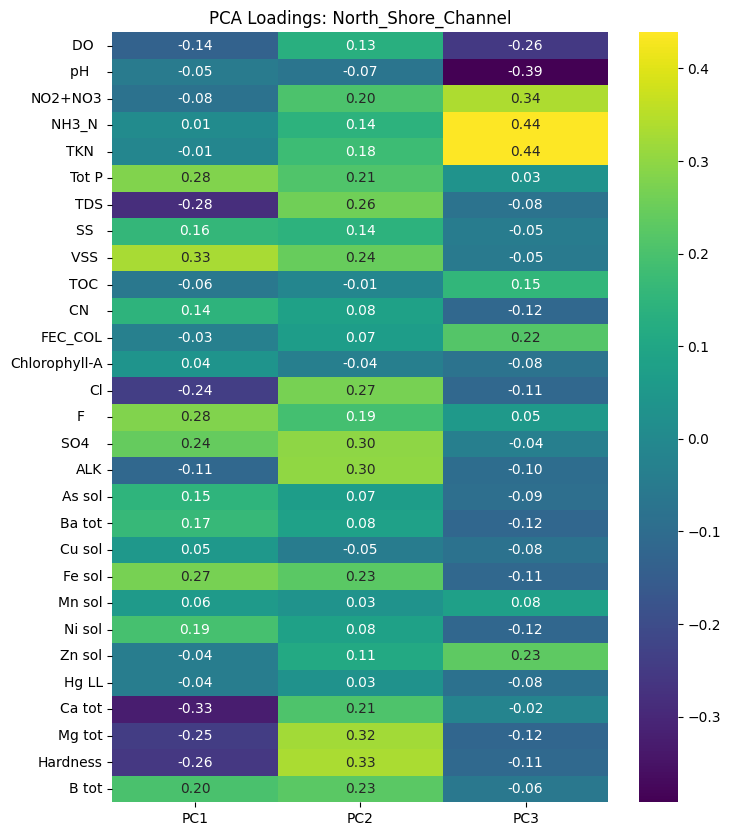

PCA for Chicago_Ship_Canal


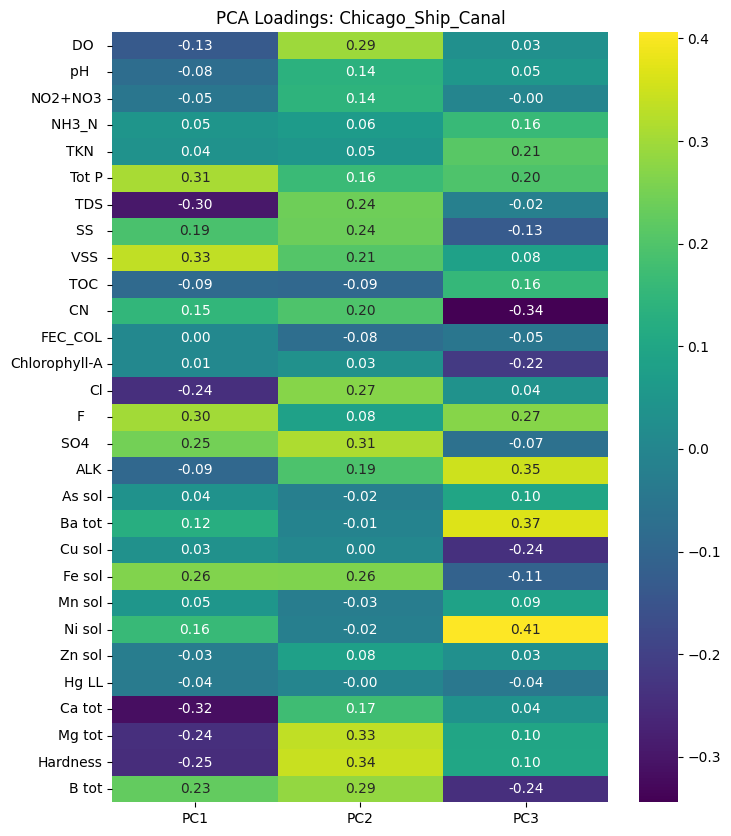

PCA for Little_Calumet_River


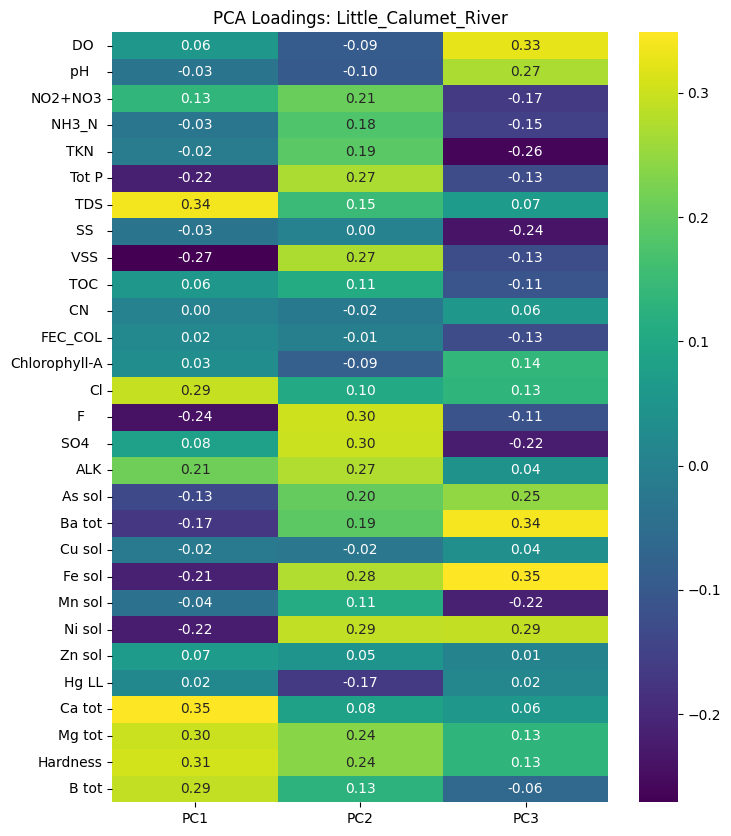

In [38]:
branch_results = {}

for name, df in branch_data.items():
    print(f"PCA for {name}")
    pca_df, load, var = run_pca_pipeline(df, vars, title_prefix=name)
    branch_results[name] = (pca_df, load, var)

## Code used for slides

In [39]:
## Creating a melted df to run boxplots comparing key variables from waterway start to ends

# Strip whitespace from all column names
full_data_clean = full_data.copy()
full_data_clean.columns = full_data_clean.columns.str.strip()

# focusing on samples where specific values (not just detection limits) were recorded
samples_of_interest = ['WQI', 'ALK', 'Cl', 'pH', 'NO2+NO3', 'Tot P', 'DO', 'Fe sol', 'Hg LL', 'B tot', 'HPI']

# salt ['Cl', 'F', 'Ca tot', 'Mg tot', 'Hardness']
# WQI ['WQI']
# metals ['Cu sol', 'Fe sol', 'Ni sol', 'Zn sol', 'Hg LL','B tot', 'HPI']
# ALK, pH, ammonia []

## samples_of_interest = ['WQI', 'ALK', 'Cl', 'F', 'Ca tot', 'SO4', 'pH', 'NO2+NO3', 'Tot P', 'DO', 'Chlorophyll-A', 'Cu sol', 'Fe sol', 'Mn sol', 'Ni sol', 'Zn sol', 'Hg LL', 'Hardness', 'Mg tot', 'B tot', 'HPI']

rivers = {
    "North Branch Canal": (NBC_start, NBC_end),
    "North Shore Channel": (NSC_start, NSC_end),
    "Chicago Sanitary & Ship Canal": (CSSC_start, CSSC_end),
    "Little Calumet River": (LCR_start, LCR_end)
}

# filter the dataframe to only include start and end sites and the samples of interest
start_end_filter_df = full_data_clean.loc[full_data_clean["Sampling"].isin(start_site_list + end_site_list), ['Collect_dt'] + ["Sampling"] + samples_of_interest].copy()

# Build a DataFrame with columns: Waterway, Location (Start/End), Value, Variable
for site in start_end_filter_df['Sampling']:
    for river_name, (start, end) in rivers.items():
        if site == start:
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Waterway'] = river_name
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Location'] = 'Start'
        elif site == end:
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Waterway'] = river_name
            start_end_filter_df.loc[start_end_filter_df['Sampling'] == site, 'Location'] = 'End'

# Melt the DataFrame for seaborn boxplotting
# 'id_vars' are the columns to keep, 'value_vars' are the measurement columns to unpivot, ignore NaNs
melted_df = start_end_filter_df.melt(id_vars = ['Sampling', 'Waterway', 'Location', 'Collect_dt'], value_vars = samples_of_interest, var_name = 'Sample Variable', value_name = 'Sample') #.sort_values(by = 'Location', ascending = False)
melted_df['Waterway_Location'] = melted_df['Waterway'] + ' ' + melted_df['Location']

#display(melted_df)

# Define boxplot order
watershed_order = ['North Branch Canal Start',
                   'North Shore Channel Start',
                   'Chicago Sanitary & Ship Canal Start',
                   'Little Calumet River Start',
                   'North Branch Canal End',
                   'North Shore Channel End',
                   'Chicago Sanitary & Ship Canal End',
                   'Little Calumet River End']
hue_order_list = ['North Branch Canal', 'North Shore Channel', 'Chicago Sanitary & Ship Canal', 'Little Calumet River']


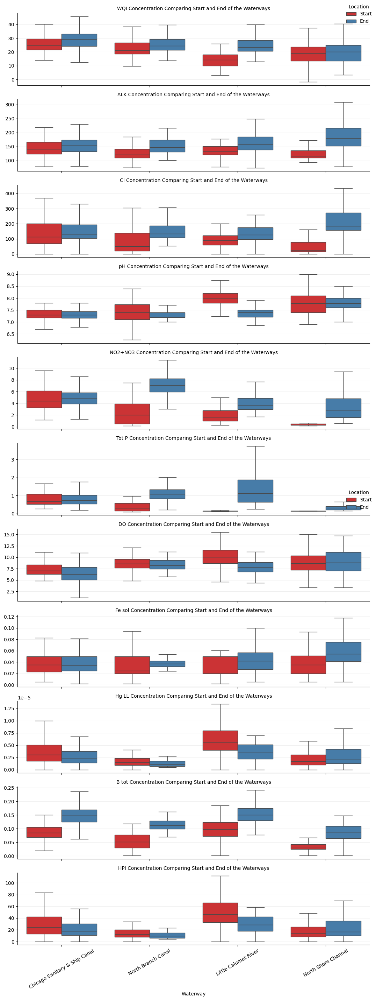

In [40]:
## Now our boxplots. Each row is a variable, x-axis is waterway, color indicates whether testing position is at start or end

# Make Start/End a categorical with fixed order
melted_df["Location"] = pd.Categorical(melted_df["Location"],
                                       categories=["Start", "End"],
                                       ordered=True)

# Shorten names in case useful later
rename_map = {
    "North Branch Canal": "NBC",
    "North Shore Channel": "NSC",
    "Chicago Sanitary & Ship Canal": "CSSC",
    "Little Calumet River": "LCR"
}
melted_df["Waterway_short"] = melted_df["Waterway"].map(rename_map)

# Catplot to generate boxplots
grid = sns.catplot(
    data = melted_df,
    kind = "box",
    x = "Waterway",             # Each waterway on x-axis
    y = "Sample",
    hue = "Location",           # Start vs. end next to each other
    row = "Sample Variable",    # One row per variable (as before)
    sharex = True,
    sharey = False,
    height = 2.6,
    aspect = 3.5,
    palette = "Set1",
    showfliers = False
)

# Adding units of concentration to y-axis
for ax in grid.axes.flatten():
    ax.tick_params(axis="x", rotation=30)
    ax.grid(axis="y", alpha=0.2)

    ## adding y axis labels with units where applicable
    sample_var = ax.get_title()

# Setting titles, axes, legends
grid.set_axis_labels("Waterway", "")
grid.add_legend(title="Location", loc="upper right")
grid.set_titles("{row_name} Concentration Comparing Start and End of the Waterways")
plt.tight_layout()

# plt.savefig('Start_end_bp.png')
# files.download('Start_end_bp.png')

plt.show()
